In [1]:
import os
import sys
#from readrec import *
import matplotlib
from scipy.signal import find_peaks
import numpy as np
import pandas as pd
import re
import glob

import matplotlib.pyplot as plt

from scipy.constants import speed_of_light

c = speed_of_light

sps = 10e6 # 10 Msps

%matplotlib inline
%config InlineBackend.close_figures=True

In [2]:
headerdt = np.dtype([
	("startOffset", "<i8"),
	("descSpan", "<i8"),
	("preTrigger", "<i8"),
	("postTrigger", "<i8"),
	("fractBase", "<i8")
])

syncposdt = np.dtype([
	("w", "<i8"),
	("f", "<u1")
])

def loadrec(file, skipsamples=False):
	head = np.frombuffer(file.read(headerdt.itemsize), dtype=headerdt)[0]
	samplebytes = (head['preTrigger'] + head['postTrigger']) * head['descSpan']
	if skipsamples:
		samples = None
		file.seek(headerdt.itemsize + samplebytes)
	else:
		samples = np.fromfile(file, count=samplebytes//16, dtype=np.dtype("(8,)<i2"))
	synclog = np.frombuffer(file.read(), dtype=syncposdt)

	return head, samples, synclog

def edges(rec):
	h, s, p = rec
	num_samples = 4096
	r = [
		(m['w'] - h['startOffset'], float(m['f']) / h['fractBase'])
		for m in p
	]

	return [
		(s[a-num_samples:a+num_samples], np.arange(-num_samples, num_samples) + b)
		for a, b in r
		if a > num_samples and a < len(s) - num_samples
	]

from matplotlib.ticker import Locator, FuncFormatter

class TimeTickLocator(Locator):
	def __init__(self, t2s, s2t):
		self.t2s, self.s2t = t2s, s2t
	
	def __call__(self):
		return list(self.tick_values(*self.axis.get_data_interval()))
	
	def tick_values(self, vmin, vmax):
		intervals = [
			"10 s", "5 s", "2 s", "1 s",
			"500 ms", "200 ms", "100 ms", "50 ms",
			"20 ms", "10 ms", "5 ms", "2 ms", "1 ms"
		]
		tmin, tmax = map(self.s2t, (vmin, vmax))
        
		for inter in reversed(intervals):
			inter_td = pd.Timedelta(inter)
			no = (tmax - tmin)/pd.Timedelta(inter)
			if no <= 10:
				break
		
		ret = []
		tick = tmin.ceil(inter)
		while tick < tmax:
			ret.append(self.t2s(tick))
			tick += inter_td
		
		return ret

def assign_time_axis(fn, header, synclog):
	sps = 10e6

	# take approximate trigger sample position and time based on header contents and filename
	approx_trigger_pos = (header['preTrigger'] - 0.5) * header['descSpan']//16
	approx_trigger_time = pd.to_datetime(fn[4:], yearfirst=True)

	# we can convert any sample position to time by comparing to trigger time and sample position
	def approx_sample_time(pos):
		return approx_trigger_time + pd.Timedelta((pos - approx_trigger_pos) / sps, 'seconds')
	
	# take sample positions of sync edges
	synclog_rel = [s[0] - header['startOffset'] for s in synclog]
	
	# pick one synclog entry to use for synchronization
	synclog_pick = np.argmin(np.abs(synclog_rel))
	tick_pos = synclog_rel[synclog_pick]
	tick_time = approx_sample_time(tick_pos).round("1 s")
	#print(approx_sample_time(tick_pos), tick_time)
    
	t2s = lambda t: ((t-tick_time)/pd.Timedelta(1, 'seconds'))*sps + tick_pos
	s2t = lambda s: tick_time + pd.Timedelta((s - tick_pos)/sps, 'seconds')
    
	#print(approx_trigger_time, s2t(approx_trigger_pos))
    
	return t2s, s2t, TimeTickLocator(t2s, s2t), FuncFormatter(lambda x, _: s2t(x).strftime("%H:%M:%S.%f")[:-4])

from matplotlib import pyplot as plt
import scipy.signal
import numpy as np
import math
import traceback
import pandas as pd

def moving_average(x, w):
    d = pd.Series(x)
    d = d.rolling(w).mean()
    return d

def waterfallize_pre(signal, bins):
    window = 0.5 * (1.0 - np.cos((2 * math.pi * np.arange(bins)) / bins))
    segment = int(bins / 2)
    nsegments = int(len(signal) / segment)
    m = np.repeat(np.reshape(signal[0:segment * nsegments], (nsegments, segment)), 2, axis=0)
    t = np.reshape(m[1:len(m) - 1], (nsegments - 1, bins))
    img = np.multiply(t, window)
    wf = np.fft.fft(img)
    return np.concatenate((wf[:, int(bins / 2):bins], wf[:, 0:int(bins / 2)]), axis=1)

def waterfallize(signal, bins):
    return np.log(np.abs(waterfallize_pre(signal, bins)))

def abs2(x):
    return x.real**2 + x.imag**2

def wf_plotrec(samples, sample_rate, freq_offset=0, freq_lim=None, bins=8192, ax=None, title=None,
       offset=0):
    img = waterfallize(samples, bins).T
    img[np.isneginf(img)] = np.nan
    # ^^ might not be needed, was copied from pysdr-recviewer
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(24, 6))
    if title is not None:
        fig.suptitle(title)

    ax.imshow(img, extent=[offset, offset+len(samples), freq_offset + sample_rate/2, freq_offset - sample_rate/2],
             aspect='auto', interpolation='none', cmap='magma')
    ax.set_xlabel('Time [s]'); ax.set_ylabel('Frequency [Hz]');
    
    if freq_lim is not None:
        ax.set_ylim(freq_lim[0] + freq_offset, freq_lim[1] + freq_offset)

    return ax


def wf(samples, sample_rate, freq_offset=0, freq_lim=None, bins=8192, ax=None, title=None,
       offset=0):
    img = waterfallize(samples, bins).T
    img[np.isneginf(img)] = np.nan
    # ^^ might not be needed, was copied from pysdr-recviewer
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(24, 6))
    if title is not None:
        fig.suptitle(title)

    ax.imshow(img, extent=[offset/sample_rate, (offset+len(samples))/sample_rate, freq_offset + sample_rate/2, freq_offset - sample_rate/2],
             aspect='auto', interpolation='none', cmap='magma')
    ax.set_xlabel('Time [s]'); ax.set_ylabel('Frequency [Hz]');
    
    if freq_lim is not None:
        ax.set_ylim(freq_lim[0] + freq_offset, freq_lim[1] + freq_offset)

    return ax


def plotrec(h, samples, synclog, fn, pre_trigger_blocks=10, post_trigger_blocks=5, title=None,
            marktimes=[]):
    t2s, s2t, ticker, formatter = assign_time_axis(fn, h, synclog)
    
    if pre_trigger_blocks > h['preTrigger']:
        pre_trigger_blocks = h['preTrigger']
    if post_trigger_blocks > h['postTrigger']:
        post_trigger_blocks = h['postTrigger']
    
    a = (h['preTrigger']-pre_trigger_blocks)*h['descSpan']//16 #select block of samples before trigger
    b = (h['preTrigger']+post_trigger_blocks)*h['descSpan']//16  #select blocks after trigger 
    
    fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8) = plt.subplots(figsize=(28, 28), nrows=8, sharex=True)
    if title is not None:
        fig.suptitle(title)
        
    ax1.xaxis.set_major_locator(ticker)
    ax1.xaxis.set_major_formatter(formatter)

    ax1.plot(range(a, b), samples[a:b,0:2], linestyle="",marker="o", alpha=.05, markersize=1)
    ax1.set_title("Channels 0 and 1")
    ax1.set_xlabel('')
    wf_plotrec(samples[a:b,0] + 1j*samples[a:b,1], 10e6, bins=8192, ax=ax2, offset=a)


    ax3.plot(range(a, b), samples[a:b,2:4], linestyle="", marker="o", alpha=.05, markersize=1)
    ax3.set_title("Channels 2 and 3")
    ax3.set_xlabel('')
    wf_plotrec(samples[a:b,2] + 1j*samples[a:b,3], 10e6, bins=8192, ax=ax4, offset=a)

    ax5.plot(range(a, b), samples[a:b,4:6], linestyle="", marker="o", alpha=.05, markersize=1)
    ax5.set_title("Channels 4 and 5")
    ax5.set_xlabel('')
    wf_plotrec(samples[a:b,4] + 1j*samples[a:b,5], 10e6, bins=8192, ax=ax6, offset=a)

    ax7.plot(range(a, b), samples[a:b,6:8], linestyle="", marker="o", alpha=.05, markersize=1)
    ax7.set_title("Channels 6 and 7")
    ax7.set_xlabel('')
    wf_plotrec(samples[a:b,6] + 1j*samples[a:b,7], 10e6, bins=8192, ax=ax8, offset=a)
    
    at, bt = s2t(a), s2t(b)
    for t in marktimes:
        if t > at and t < bt:
            for ax in [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8]:
                ax.axvline(x=t2s(t), color='purple', ls='--')
    return fig
    #plt.show()

def axis_plotrec(axis, h, signal_samples, a, b, ticker, formatter, title, sps=10e6):
    
    axis.xaxis.set_major_locator(ticker)
    axis.xaxis.set_major_formatter(formatter)
    axis.plot(range(a, b), signal_samples, linestyle="", marker=".", alpha=0.5, markersize=1)
    #axis.plot(range(a, b), moving_average(signal_samples, 20), linestyle="", marker=".", alpha=0.5, markersize=1, color="red")

    axis.set_title(title)
    axis.set_xlabel('')
    
    axis.set_ylim(-10000, 10000)
    axis.grid()        

    #threshold = 2300

    #z_score = abs(signal_samples - start_noise_mean) / start_noise_std
    #start_i = np.argmax(np.abs(signal_samples) > threshold) 
    #stop_i = len(signal_samples) - np.argmax(np.flip(np.abs(signal_samples) > threshold) )

    #event_duration = (stop_i-start_i)/sps
    #axis.text(start_i, 6000,"Event Duration: {0:.3g} s".format(event_duration), fontsize=15)
    #axis.axvspan(start_i+a,stop_i+a, facecolor='green', alpha=0.2)

    # Tohle nefunguje spravne 
    #axis.axvline(x=(h['preTrigger']), color='b')
    #print("ticker", ticker)


    
def selective_plotrec(h, samples, synclog, fn, pre_trigger_blocks=10, post_trigger_blocks=5, title=None, marktimes=[], channels = []):
    t2s, s2t, ticker, formatter = assign_time_axis(fn, h, synclog)
    
    fig, (ax7) = plt.subplots(figsize=(28, 20), nrows=len(channels), sharex=True)
    if title is not None:
        fig.suptitle(title)
    
    for i, ch in enumerate(channels):
        
        #if pre_trigger_blocks > h['preTrigger']:
        pre_trigger_blocks = h['preTrigger']
        #if post_trigger_blocks > h['postTrigger']:
        post_trigger_blocks = h['postTrigger']

        a = (h['preTrigger']-pre_trigger_blocks)*h['descSpan']//16 #select block of samples before trigger
        b = (h['preTrigger']+post_trigger_blocks)*h['descSpan']//16  #select blocks after trigger 

        signal_samples = samples[a:b,ch]        
        axis_plotrec(ax7[i], h, signal_samples, a, b, ticker, formatter, str("channel: {}".format(ch)))

    return fig

In [3]:
def multistation_plotrec(files):
    
    plt.close("all")
    
    channels = [0,1,3]
    fig, ax = plt.subplots(figsize=(35, 20), nrows=len(channels)*len(files), sharex=True)
    title = None
    
    data = {f:{"filename": f} for f in files}
    print(data)
    
    mintime = None
    
    for j, filepath in enumerate(data):
        print(j, filepath)
        try:
            with open(filepath, 'rb') as file:
                fn = os.path.basename(filepath)
                h, samples, synclog = loadrec(file)
                t2s, s2t, ticker, formatter = assign_time_axis(fn, h, synclog)

                time = s2t(0)
                if not mintime:
                    mintime = time
                if mintime > time:
                    mintime = time
        except Exception as e:
            print("Vyjimka 1", e)


    print("Znam minimalni cas", mintime)
    
    for j, filepath in enumerate(data):
        print(j, filepath)
        try:
            with open(filepath, 'rb') as file:
                fn = os.path.basename(filepath)

                h, samples, synclog = loadrec(file)
                t2s, s2t, ticker, formatter = assign_time_axis(fn, h, synclog)
                print("zacatek", s2t(0))
                offset = -int(t2s(mintime))
                #print("offset", offset)

                if title is not None:
                    fig.suptitle(title)

                for i, ch in enumerate(channels):
                    i += len(channels)*j
                    #print(i)

                    pre_trigger_blocks = h['preTrigger']
                    post_trigger_blocks = h['postTrigger']

                    a = (h['preTrigger']-pre_trigger_blocks)*h['descSpan']//16 #select block of samples before trigger
                    b = (h['preTrigger']+post_trigger_blocks)*h['descSpan']//16  #select blocks after trigger 
                    #print(a, b)

                    signal_samples = samples[a:b,ch]
                    #print(a, b, len(samples[:,0]))

                    axis_plotrec(ax[i], h, signal_samples, a+offset, b+offset, ticker, formatter, str("{}, channel: {}".format(filepath, ch)))
        except Exception as e:
            print("Vyjimka", e)
        print("Done", fn)

    return fig

{'/storage/experiments/2022/0909_bourka_CAR2/parallella-VLF/rec_220909-161250.80': {'filename': '/storage/experiments/2022/0909_bourka_CAR2/parallella-VLF/rec_220909-161250.80'}, '/storage/experiments/2022/0909_bourka_CAR0/parallella-VLF/rec_220909-161250.80': {'filename': '/storage/experiments/2022/0909_bourka_CAR0/parallella-VLF/rec_220909-161250.80'}, '/storage/experiments/2022/0909_bourka_CAR1/parallella-VLF/rec_220909-161250.81': {'filename': '/storage/experiments/2022/0909_bourka_CAR1/parallella-VLF/rec_220909-161250.81'}}
0 /storage/experiments/2022/0909_bourka_CAR2/parallella-VLF/rec_220909-161250.80
1 /storage/experiments/2022/0909_bourka_CAR0/parallella-VLF/rec_220909-161250.80
2 /storage/experiments/2022/0909_bourka_CAR1/parallella-VLF/rec_220909-161250.81
Znam minimalni cas 2022-09-09 16:12:49.069975500
0 /storage/experiments/2022/0909_bourka_CAR2/parallella-VLF/rec_220909-161250.80
zacatek 2022-09-09 16:12:49.069975500
Done rec_220909-161250.80
1 /storage/experiments/2022/

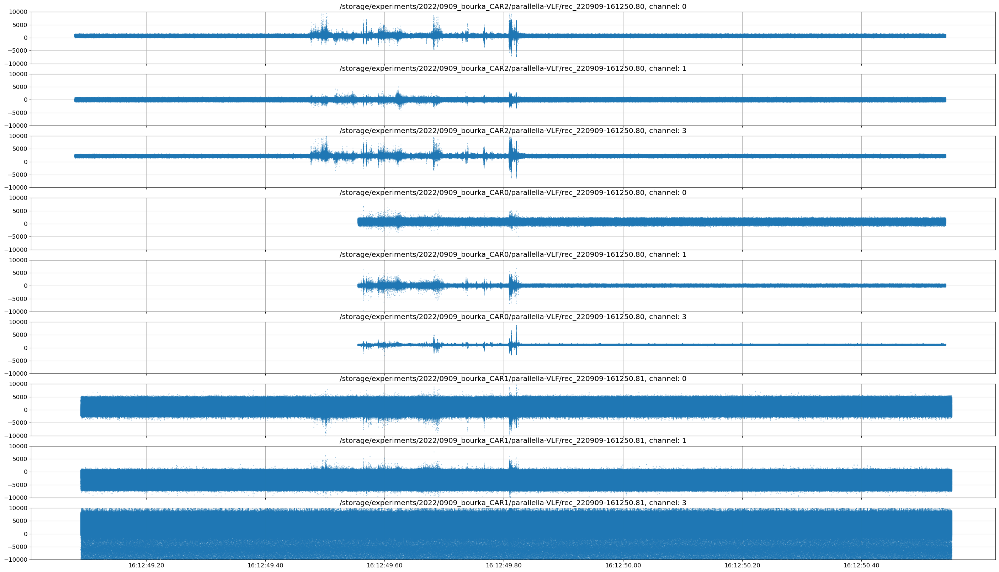

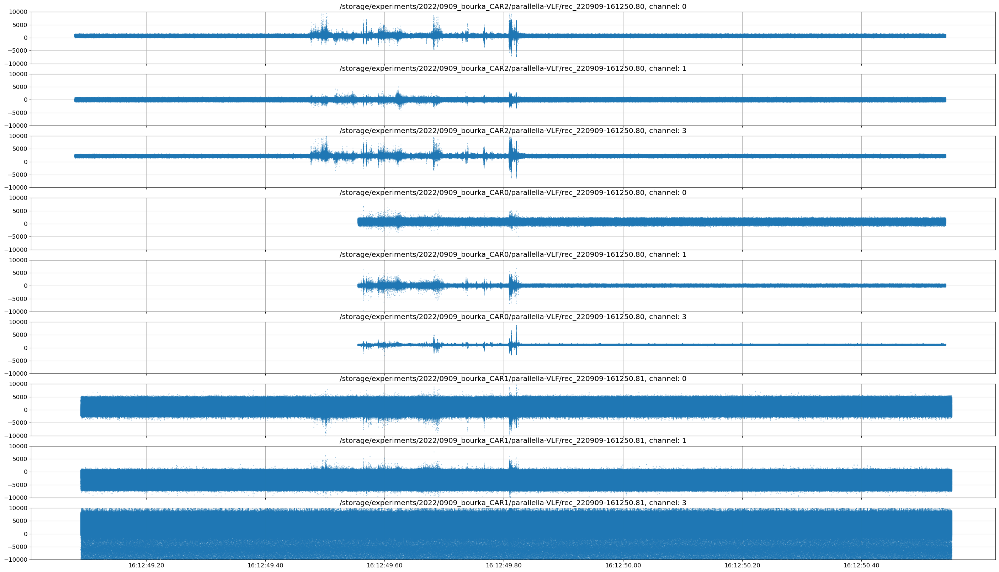

In [7]:
## Bourka hnědouhelné doly 
files = ['/storage/experiments/2022/0909_bourka_CAR2/parallella-VLF/rec_220909-161250.80',
         '/storage/experiments/2022/0909_bourka_CAR0/parallella-VLF/rec_220909-161250.80',
         '/storage/experiments/2022/0909_bourka_CAR1/parallella-VLF/rec_220909-161250.81']

#files = ['/storage/experiments/2022/0826_bourka_staryvestec_CAR2/parallella-VLF/rec_220826-163022.70',
#         '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/parallella-VLF/rec_220826-163022.43',
#         '/storage/experiments/2022/0826_bourka_staryvestec_CAR1/parallella/rec_220826-163022.62']

#files = ['/storage/experiments/2022/0826_bourka_staryvestec_CAR2/parallella-VLF/rec_220826-163022.70']



#files = ['/storage/experiments/2022/0826_bourka_staryvestec_CAR2/parallella-VLF/rec_220826-160903.93']

#files = ['/storage/experiments/2022/0909_bourka_CAR1/parallella-VLF/rec_220909-163758.46',
#        '/storage/experiments/2022/0909_bourka_CAR0/parallella-VLF/rec_220909-163757.76',
#        '/storage/experiments/2022/0909_bourka_CAR2/parallella-VLF/rec_220909-163757.76']

plt.rcParams.update({'font.size': 12}) 
multistation_plotrec(files)

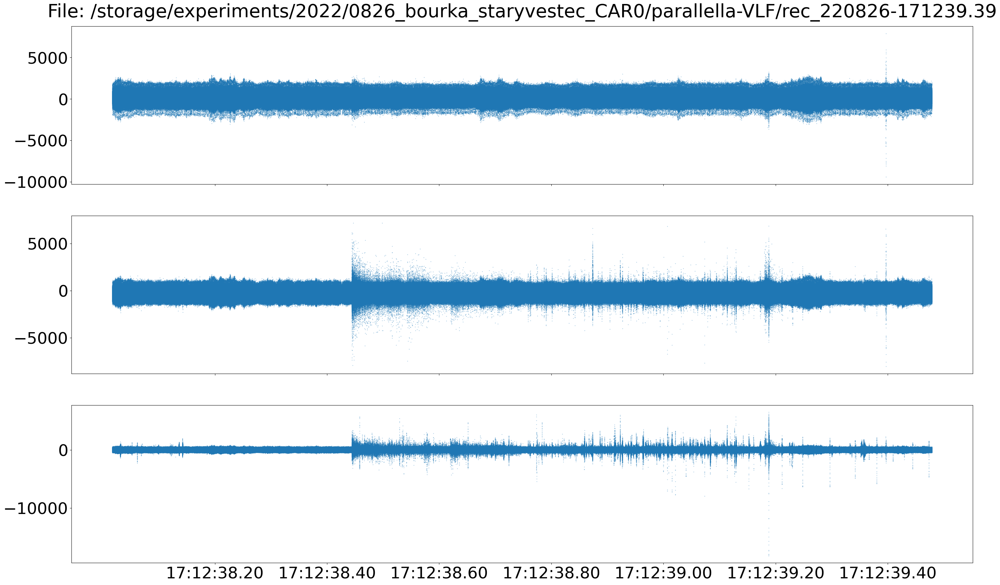

In [135]:

filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR2/parallella-VLF/rec_220826-161131.74'
filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/parallella-VLF/rec_220826-161132.60'
filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/parallella-VLF/rec_220826-171239.39'
#filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR1/parallella/rec_220826-161238.85'
#filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/parallella-VLF/rec_220826-174030.37'

channels = [0, 1, 3]
nrows = len(channels) * 1
fig, axs = plt.subplots(figsize=(35, 7 * nrows), nrows=nrows, sharex=True)

mintime = None
data = []

# Load and process data
try:
    with open(filepath, 'rb') as file:
        fn = os.path.basename(filepath)
        h, samples, synclog = loadrec(file)
        t2s, s2t, ticker, formatter = assign_time_axis(fn, h, synclog)

        time = s2t(0)
        mintime = time if mintime is None else min(mintime, time)

        # Add data to the list for later processing
        data.append((filepath, h, samples, synclog, t2s, s2t, ticker, formatter))
except Exception as e:
    print(f"Exception: {e}")

# Render data
ax_idx = 0
for i, (filepath, h, samples, synclog, t2s, s2t, ticker, formatter) in enumerate(data):
    offset = -int(t2s(mintime))

    # Use full path for the file label only once above the first channel
    axs[ax_idx].set_title(f"File: {filepath}", fontsize=40, pad=20)

    a = (h['preTrigger'] - h['preTrigger']) * h['descSpan'] // 16
    b = (h['preTrigger'] + h['postTrigger']) * h['descSpan'] // 16
    for ch in channels:
        signal_samples = samples[a:b, ch]

        axs[ax_idx].xaxis.set_major_locator(ticker)
        axs[ax_idx].xaxis.set_major_formatter(formatter)
        axs[ax_idx].plot(range(a + offset, b + offset), signal_samples, linestyle="", marker=".", alpha=0.5, markersize=1)

        axs[ax_idx].tick_params(axis='x', which='major', labelsize=35)
        axs[ax_idx].tick_params(axis='y', which='major', labelsize=35)

        ax_idx += 1


plt.show()

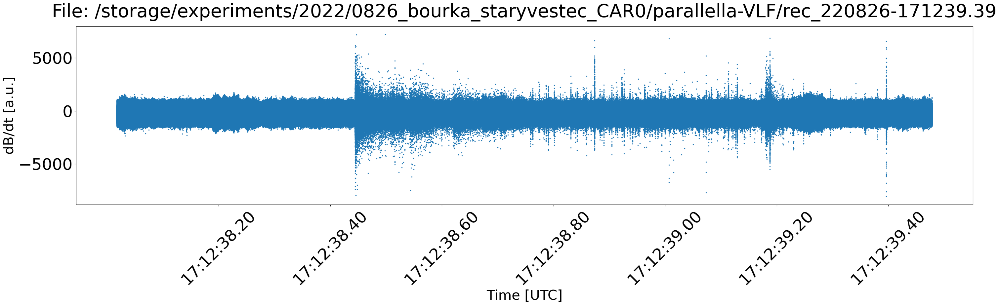

In [359]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import os

# Vybraný vstupní soubor
filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/parallella-VLF/rec_220826-171239.39'

channels = [1]  # pouze kanál 3
nrows = len(channels)
fig, axs = plt.subplots(figsize=(35, 7 * nrows), nrows=nrows, sharex=True)
if nrows == 1:
    axs = [axs]  # zabalit do seznamu, aby bylo možné iterovat

mintime = None
data = []

# Načtení a zpracování dat
try:
    with open(filepath, 'rb') as file:
        fn = os.path.basename(filepath)
        h, samples, synclog = loadrec(file)
        t2s, s2t, xticker, xformatter = assign_time_axis(fn, h, synclog)

        time = s2t(0)
        mintime = time if mintime is None else min(mintime, time)

        data.append((filepath, h, samples, synclog, t2s, s2t, xticker, xformatter))
except Exception as e:
    print(f"Exception: {e}")

# vykreslení
ax_idx = 0
for filepath, h, samples, synclog, t2s, s2t, xticker, xformatter in data:
    offset = -int(t2s(mintime))

    a = (h['preTrigger'] - h['preTrigger']) * h['descSpan'] // 16
    b = (h['preTrigger'] + h['postTrigger']) * h['descSpan'] // 16

    axs[ax_idx].set_title(f"File: {filepath}", fontsize=40, pad=20)

    for ch in channels:
        signal_samples = samples[a:b, ch]
        axs[ax_idx].xaxis.set_major_locator(xticker)
        axs[ax_idx].xaxis.set_major_formatter(xformatter)

        axs[ax_idx].plot(
            range(a + offset, b + offset),
            signal_samples,
            linestyle="",
            marker=".",
            alpha=1.,
            markersize=3
        )

        axs[ax_idx].tick_params(axis='x', which='major', labelsize=35)
        axs[ax_idx].tick_params(axis='y', which='major', labelsize=35)
        axs[ax_idx].set_ylabel("dB/dt [a.u.]", fontsize=30)
        ax_idx += 1

plt.xticks(rotation=45)
plt.xlabel("Time [UTC]", fontsize=30)
plt.show()


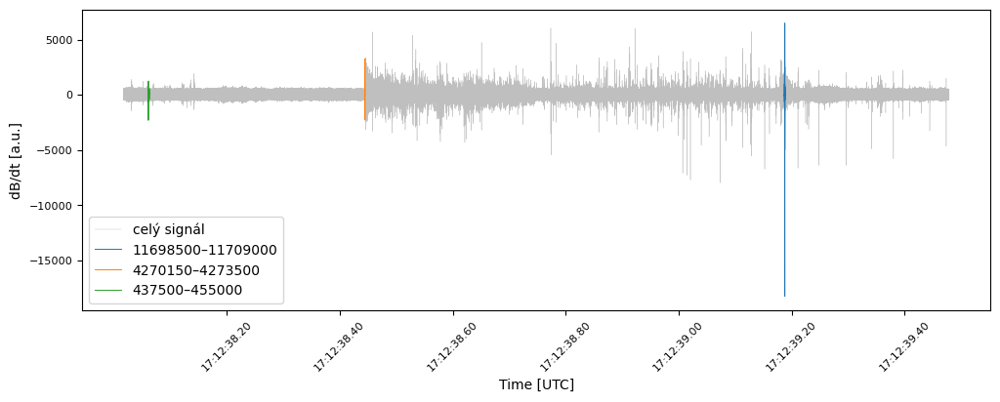

In [602]:
import matplotlib.pyplot as plt
import numpy as np

# --- Výřezy (vzorkové indexy) ---
slices = np.array([
    (11_698_500, 11_709_000),
    (4_270_150, 4_273_500),
    (437_500,   455_000)
])

# --- Vykreslení ---
plt.figure(figsize=(12, 4))
plt.tick_params(axis='both', labelsize=8)

# --- Celý signál (indexová osa) ---
indices_all = np.arange(len(signal_samples))
plt.plot(indices_all, signal_samples, color='gray', linewidth=0.3, alpha=0.5, label="celý signál")

# --- Výřezy ---
for start, end in slices:
    plt.plot(
        np.arange(start, end),
        signal_samples[start:end],
        linewidth=0.7,
        label=f"{start}–{end}"
    )

# --- Nastavení osy X jako časové (přes formatovací funkce) ---
ax = plt.gca()
ax.xaxis.set_major_locator(xticker)       # ← převzato z assign_time_axis
ax.xaxis.set_major_formatter(xformatter)  # ← převzato z assign_time_axis
plt.xticks(rotation=45)

plt.xlabel("Time [UTC]")
plt.ylabel("dB/dt [a.u.]")
plt.legend()
plt.show()


In [286]:
len(signal_samples)

14614528

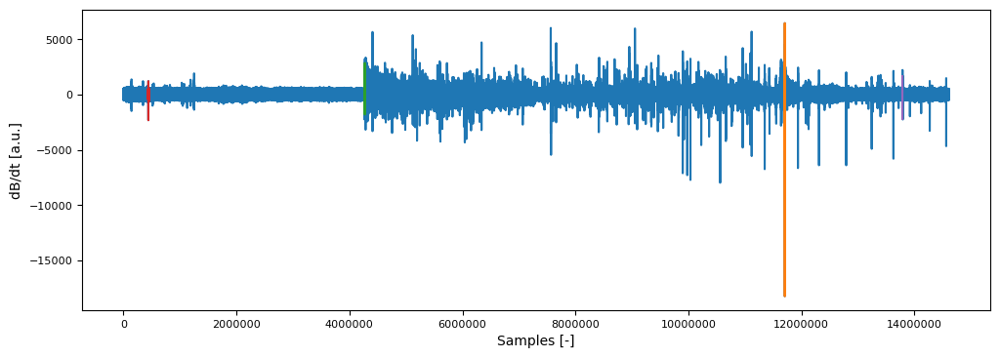

In [591]:
import matplotlib.ticker as ticker

plt.figure(figsize=(12, 4))
plt.tick_params(axis='both', labelsize=8) 
plt.plot(signal_samples)
start = 11_698_500
end = 11_709_000
plt.plot(range(start, end), signal_samples[start:end])
start = 4_270_150
end = 4_273_000
plt.plot(range(start, end), signal_samples[start:end])
start = 437_500
end = 455_000
plt.plot(range(start, end), signal_samples[start:end])
start = 13_794_000
end = 13_795_000
plt.plot(range(start, end), signal_samples[start:end])

ax = plt.gca()
ax.xaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=False))
ax.ticklabel_format(style='plain', axis='x')  # Zakáže vědeckou notaci na ose X

plt.xlabel("Samples [-]")
plt.ylabel("dB/dt [a.u.]")

plt.show()


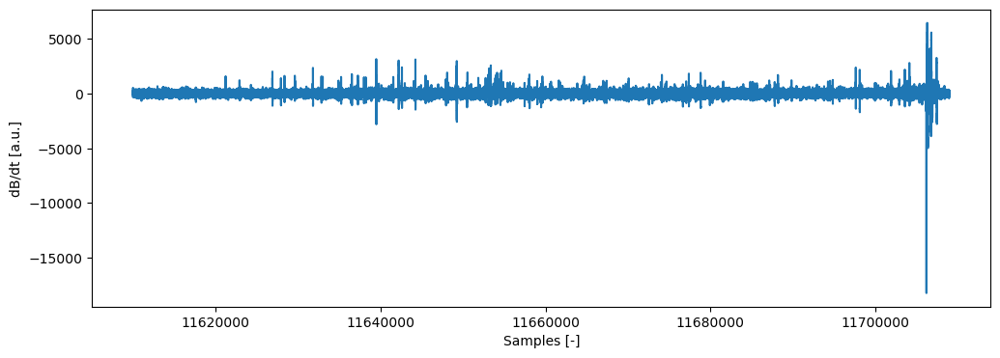

In [151]:
import matplotlib.ticker as ticker

plt.figure(figsize=(12, 4))
plt.rcParams.update({'font.size': 10})

start = 11_610_000
end = 11_709_000
plt.plot(range(start, end), signal_samples[start:end])

ax = plt.gca()
formatter = ticker.ScalarFormatter(useOffset=False, useMathText=False)
formatter.set_scientific(False)
ax.xaxis.set_major_formatter(formatter)

plt.xlabel("Samples [-]")
plt.ylabel("dB/dt [a.u.]")

plt.show()


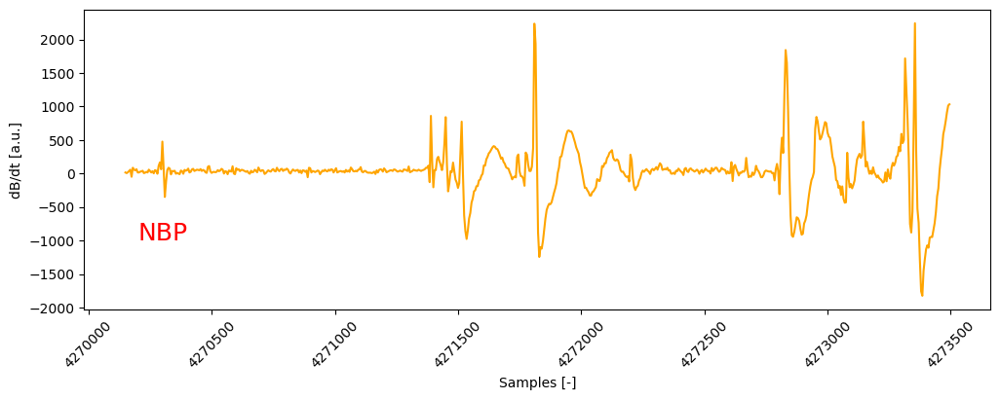

In [603]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np

# --- Funkce pro blokové průměrování ---
def block_average_decimate(signal, factor):
    length = len(signal) - len(signal) % factor  # zarovná na celé bloky
    reshaped = signal[:length].reshape(-1, factor)
    return reshaped.mean(axis=1)

# --- Výběr úseku signálu ---
start = 4_270_150
end = 4_273_500
segment = signal_samples[start:end]

# --- Decimace s průměrováním ---
factor = 5

aligned_length = len(segment) - len(segment) % factor
segment = segment[:aligned_length]
decimated = block_average_decimate(segment, factor)

# --- Odpovídající X osa pro decimovaný signál ---
x_decimated = np.linspace(start, start + aligned_length, len(decimated), endpoint=False)


# --- Vykreslení ---
plt.figure(figsize=(12, 4))
plt.rcParams.update({'font.size': 10})

plt.plot(x_decimated, decimated, color='orange')
#plt.ylim(-7500, 5000)

ax = plt.gca()
formatter = ticker.ScalarFormatter(useOffset=False, useMathText=False)
formatter.set_scientific(False)
ax.xaxis.set_major_formatter(formatter)
plt.xticks(rotation=45)

plt.xlabel("Samples [-]")
plt.ylabel("dB/dt [a.u.]")

plt.text(4270200, -1000 , f'NBP', fontsize=18, color='r')

plt.show()


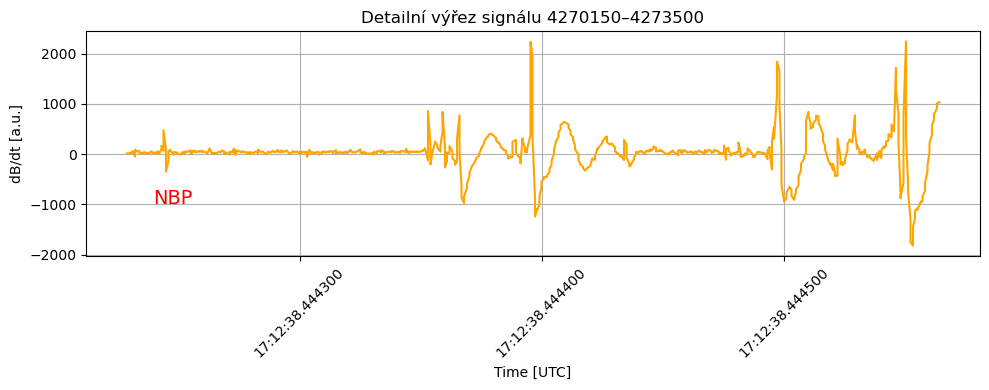

In [613]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates
import pandas as pd

# --- Výběr konkrétního výřezu (druhý v pořadí, index 1) ---
start, end = slices[1]  # slice 1 = (4_270_150, 4_273_500)
segment = signal_samples[start:end]

# --- Parametry ---
factor = 5  # decimační faktor
aligned_len = len(segment) - len(segment) % factor
segment = segment[:aligned_len]

# --- Decimace pomocí blokového průměrování ---
def block_average_decimate(signal, factor):
    return signal.reshape(-1, factor).mean(axis=1)

decimated = block_average_decimate(segment, factor)

# --- Vytvoření časové osy pro decimovaná data ---
sample_indices = np.arange(start, start + aligned_len, factor)

# Pokud je s2t definováno pro skalární vstupy, použij vektorovou verzi
s2t_vec = np.vectorize(s2t)
timestamps = s2t_vec(sample_indices)


# --- Vykreslení ---
plt.figure(figsize=(10, 4))
plt.plot(timestamps, decimated, color='orange')

# Nápis "NBP" na časové ose
nbp_index = 4270250
nbp_time = s2t(nbp_index)
plt.text(nbp_time, -1000, "NBP", fontsize=14, color='red')


plt.xlabel("Time [UTC]")
plt.ylabel("dB/dt [a.u.]")
plt.title(f"Detailní výřez signálu {start}–{end}")
plt.xticks(rotation=45)

# Vylepšení formátu časové osy
ax = plt.gca()
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M:%S.%f"))

plt.grid()
plt.tight_layout()
plt.show()


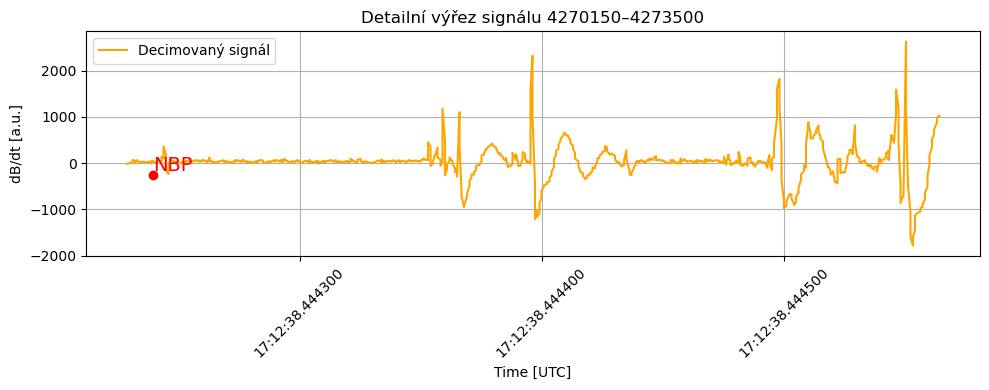

In [615]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates
import pandas as pd
from scipy.ndimage import uniform_filter1d

# --- Výběr konkrétního výřezu (druhý v pořadí, index 1) ---
start, end = slices[1]  # slice 1 = (4_270_150, 4_273_500)
segment = signal_samples[start:end]

# --- Parametry ---
factor = 5  # decimační faktor
aligned_len = len(segment) - len(segment) % factor
segment = segment[:aligned_len]

# --- Decimace pomocí vyhlazeného průměru (lepší než čistý blokový) ---
decimated = uniform_filter1d(segment, size=factor)[::factor]

# --- Vytvoření časové osy pro decimovaná data ---
sample_indices = np.arange(start, start + aligned_len, factor)
s2t_vec = np.vectorize(s2t)
timestamps = s2t_vec(sample_indices)

# --- NBP ---
nbp_index = 4270250
nbp_time = s2t(nbp_index)
nbp_value = signal_samples[nbp_index]

# --- Vykreslení ---
plt.figure(figsize=(10, 4))
plt.plot(timestamps, decimated, color='orange', label='Decimovaný signál')

# Označení NBP
plt.text(nbp_time, nbp_value, "NBP", fontsize=14, color='red', ha='left', va='bottom')
plt.plot(nbp_time, nbp_value, marker='o', color='red')  # bod v signálu

plt.xlabel("Time [UTC]")
plt.ylabel("dB/dt [a.u.]")
plt.title(f"Detailní výřez signálu {start}–{end}")
plt.xticks(rotation=45)

# Vylepšený formát osy X
ax = plt.gca()
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M:%S.%f"))

plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


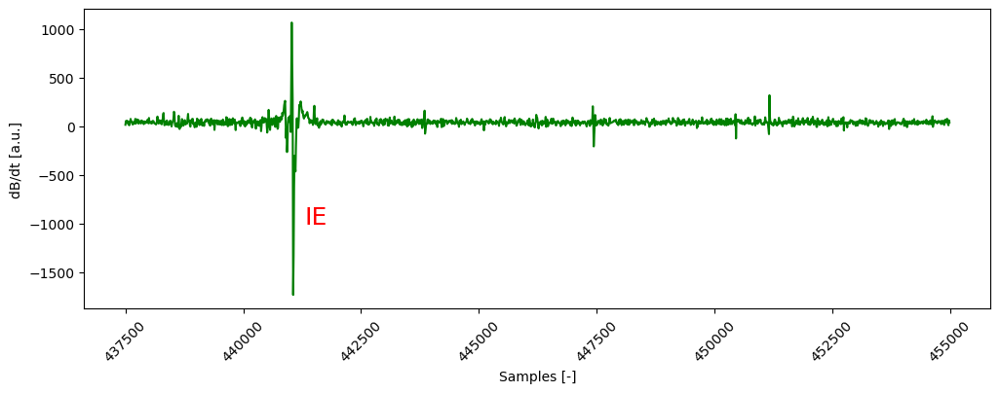

In [355]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np

# --- Funkce pro blokové průměrování ---
def block_average_decimate(signal, factor):
    length = len(signal) - len(signal) % factor  # zarovná na celé bloky
    reshaped = signal[:length].reshape(-1, factor)
    return reshaped.mean(axis=1)

# --- Výběr úseku signálu ---
start = 437_500
end = 455_000
segment = signal_samples[start:end]

# --- Decimace s průměrováním ---
factor = 10

aligned_length = len(segment) - len(segment) % factor
segment = segment[:aligned_length]
decimated = block_average_decimate(segment, factor)

# --- Odpovídající X osa pro decimovaný signál ---
x_decimated = np.linspace(start, start + aligned_length, len(decimated), endpoint=False)


# --- Vykreslení ---
plt.figure(figsize=(12, 4))
plt.rcParams.update({'font.size': 10})

plt.plot(x_decimated, decimated, color='green')
#plt.ylim(-7500, 5000)

ax = plt.gca()
formatter = ticker.ScalarFormatter(useOffset=False, useMathText=False)
formatter.set_scientific(False)
ax.xaxis.set_major_formatter(formatter)
plt.xticks(rotation=45)

plt.xlabel("Samples [-]")
plt.ylabel("dB/dt [a.u.]")

plt.text(441300, -1000 , f'IE', fontsize=18, color='r')

plt.show()


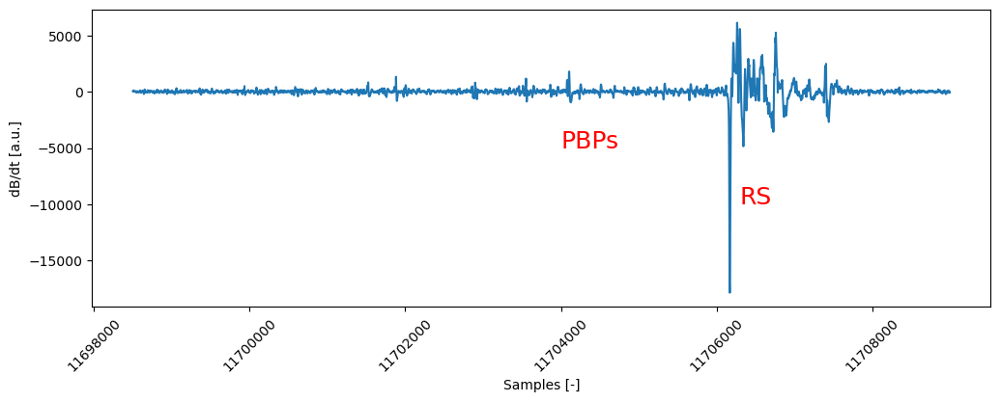

In [588]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np

# --- Funkce pro blokové průměrování ---
def block_average_decimate(signal, factor):
    length = len(signal) - len(signal) % factor  # zarovná na celé bloky
    reshaped = signal[:length].reshape(-1, factor)
    return reshaped.mean(axis=1)

# --- Výběr úseku signálu ---
start = 11_698_500
end = 11_709_000
segment = signal_samples[start:end]

# --- Decimace s průměrováním ---
factor = 3

aligned_length = len(segment) - len(segment) % factor
segment = segment[:aligned_length]
decimated = block_average_decimate(segment, factor)

# --- Odpovídající X osa pro decimovaný signál ---
x_decimated = np.linspace(start, start + aligned_length, len(decimated), endpoint=False)


# --- Vykreslení ---
plt.figure(figsize=(12, 4))
plt.rcParams.update({'font.size': 10})

plt.plot(x_decimated, decimated)
#plt.ylim(-10000, 5500)

ax = plt.gca()
formatter = ticker.ScalarFormatter(useOffset=False, useMathText=False)
formatter.set_scientific(False)
ax.xaxis.set_major_formatter(formatter)
plt.xticks(rotation=45)

plt.xlabel("Samples [-]")
plt.ylabel("dB/dt [a.u.]")

plt.text(11704000, -5000 , f'PBPs', fontsize=18, color='r')
plt.text(11706300, -10000 , f'RS', fontsize=18, color='r')


plt.show()


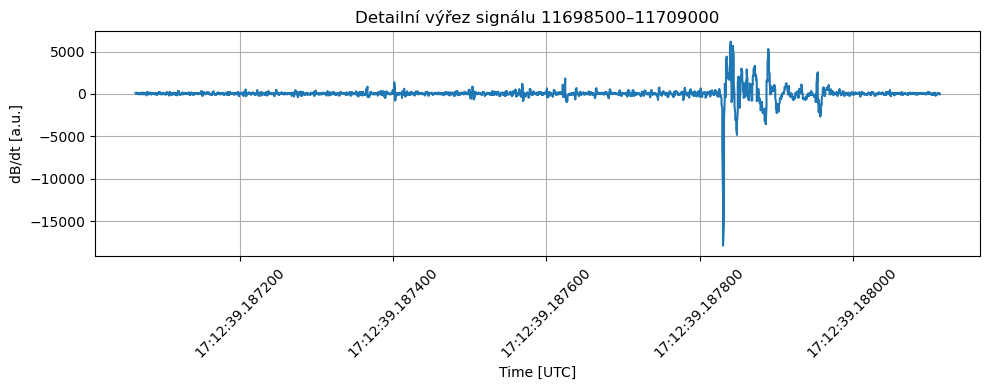

In [634]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates
import pandas as pd

# --- Výběr konkrétního výřezu (druhý v pořadí, index 1) ---
start, end = slices[0]  # slice 1 = (4_270_150, 4_273_500)
#start = 11_650_000
#end = 11_709_000
segment = signal_samples[start:end]

# --- Parametry ---
factor = 3  # decimační faktor
aligned_len = len(segment) - len(segment) % factor
segment = segment[:aligned_len]

# --- Decimace pomocí blokového průměrování ---
def block_average_decimate(signal, factor):
    return signal.reshape(-1, factor).mean(axis=1)

decimated = block_average_decimate(segment, factor)

# --- Vytvoření časové osy pro decimovaná data ---
sample_indices = np.arange(start, start + aligned_len, factor)

# Pokud je s2t definováno pro skalární vstupy, použij vektorovou verzi
s2t_vec = np.vectorize(s2t)
timestamps = s2t_vec(sample_indices)


# --- Vykreslení ---
plt.figure(figsize=(10, 4))
plt.plot(timestamps, decimated)

# Nápis "NBP" na časové ose
#nbp_index = 4270250
#nbp_time = s2t(nbp_index)
#plt.text(nbp_time, -1000, "NBP", fontsize=14, color='red')


plt.xlabel("Time [UTC]")
plt.ylabel("dB/dt [a.u.]")
plt.title(f"Detailní výřez signálu {start}–{end}")
plt.xticks(rotation=45)

# Vylepšení formátu časové osy
ax = plt.gca()
ax.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M:%S.%f"))

plt.grid()
plt.tight_layout()
plt.show()


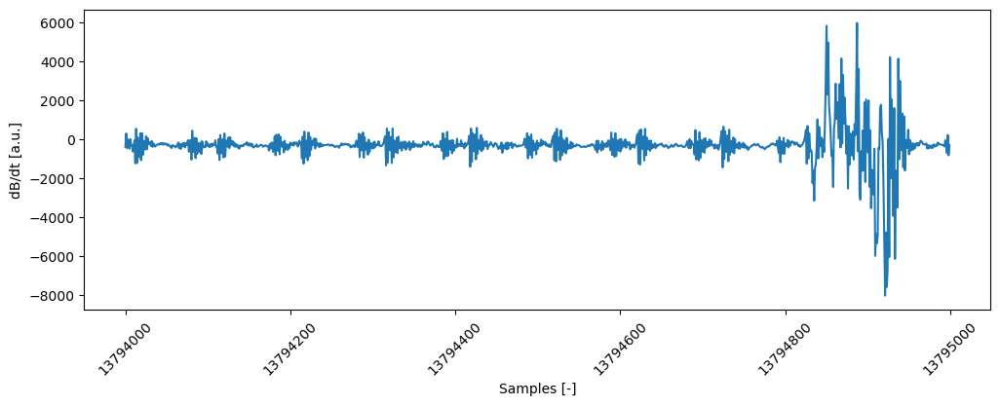

In [362]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np

# --- Funkce pro blokové průměrování ---
def block_average_decimate(signal, factor):
    length = len(signal) - len(signal) % factor  # zarovná na celé bloky
    reshaped = signal[:length].reshape(-1, factor)
    return reshaped.mean(axis=1)

# --- Výběr úseku signálu ---
start = 13_794_000
end = 13_795_000
segment = signal_samples[start:end]

# --- Decimace s průměrováním ---
factor = 1

aligned_length = len(segment) - len(segment) % factor
segment = segment[:aligned_length]
decimated = block_average_decimate(segment, factor)

# --- Odpovídající X osa pro decimovaný signál ---
x_decimated = np.linspace(start, start + aligned_length, len(decimated), endpoint=False)


# --- Vykreslení ---
plt.figure(figsize=(12, 4))
plt.rcParams.update({'font.size': 10})

plt.plot(x_decimated, decimated)
#plt.ylim(-10000, 5500)

ax = plt.gca()
formatter = ticker.ScalarFormatter(useOffset=False, useMathText=False)
formatter.set_scientific(False)
ax.xaxis.set_major_formatter(formatter)
plt.xticks(rotation=45)

plt.xlabel("Samples [-]")
plt.ylabel("dB/dt [a.u.]")

#plt.text(11704000, -5000 , f'PBP', fontsize=18, color='r')
#plt.text(11706300, -10000 , f'RS', fontsize=18, color='r')


plt.show()


/storage/experiments/2022/0826_bourka_staryvestec_CAR0/chronos/2022-08-26-17-12-39.402083-lightning.mp4.csv


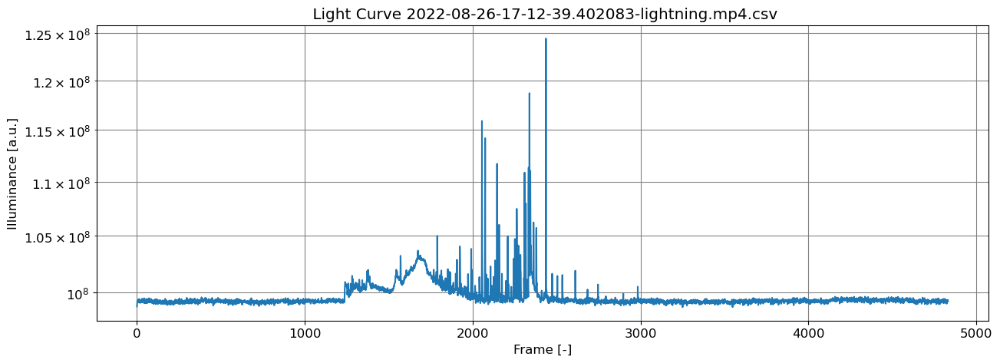

In [388]:
directory = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/chronos'

for f in glob.iglob(directory + "/*-39.*.mp4.csv"): # generator, search immediate subdirectories 
    try:
        s = f.split('/')
        st = s[len(s)-1]
        print(f)
        y = pd.read_csv(f)

        plt.figure(figsize=(15,5))
        plt.rc('font', size=12)    

        plt.plot(y['0'])
        plt.yscale('log')
        plt.title(' Light Curve ' + st)
        plt.xlabel('Frame [-]')
        plt.ylabel('Illuminance [a.u.]')
        plt.grid(visible=True, which='major', color='grey', linestyle='-')
        plt.grid(visible=True, which='minor', color='grey', linestyle='-')
        #plt.xticks(np.arange(0, 4000, 100))
        plt.show()

    except:
        pass


/storage/experiments/2022/0826_bourka_staryvestec_CAR0/chronos/2022-08-26-17-12-39.402083-lightning.mp4.csv
4832


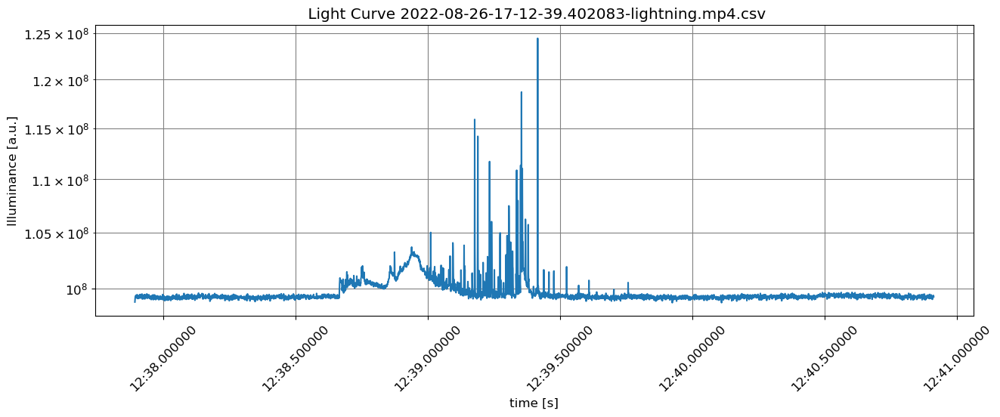

In [409]:
for f in glob.iglob(directory + "/*-39.*.mp4.csv"): # generator, search immediate subdirectories 
    try:
        s = f.split('/')
        st = s[len(s)-1]
        print(f)
        y = pd.read_csv(f)
        print(len(y))
        snaps = len(y)
        tsnap = 1/1600
        y['time'] = y.index * tsnap - snaps * tsnap /2
        #y['time'] = (y.index - (4838/2))*(3/4838)
        y['abstime'] = pd.to_datetime('2022-08-26 17:12:39.402083') + pd.to_timedelta(y['time'], 's')
        
        
        plt.figure(figsize=(15,5))
        plt.rc('font', size=12)    

        plt.plot(y['abstime'],y['0'])
        plt.yscale('log')
        plt.title(' Light Curve ' + st)
        plt.xlabel('time [s]')
        plt.ylabel('Illuminance [a.u.]')
        plt.grid(which='major', color='grey', linestyle='-')
        plt.grid(which='minor', color='grey', linestyle='-')
        #plt.xticks(np.arange(-1, 1, 0.1))
        plt.xticks(rotation=45)

    except:
        pass


In [408]:
y

,Unnamed: 0,0,time,abstime
0,0,98819658.0,-1.510000,2022-08-26 17:12:37.892083000
1,1,99078271.0,-1.509375,2022-08-26 17:12:37.892708000
2,2,99209722.0,-1.508750,2022-08-26 17:12:37.893333000
3,3,99277527.0,-1.508125,2022-08-26 17:12:37.893958000
4,4,99247741.0,-1.507500,2022-08-26 17:12:37.894583001
...,...,...,...,...
4827,4827,99303033.0,1.506875,2022-08-26 17:12:40.908957999
4828,4828,99229947.0,1.507500,2022-08-26 17:12:40.909582999
4829,4829,99364049.0,1.508125,2022-08-26 17:12:40.910208000
4830,4830,99378119.0,1.508750,2022-08-26 17:12:40.910833000


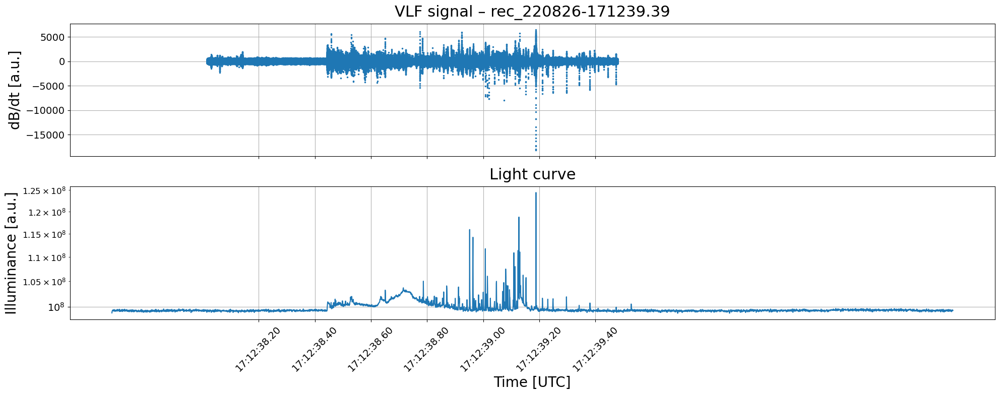

In [459]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import glob

# --- VLF signál ---
filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/parallella-VLF/rec_220826-171239.39'
channel = 3

with open(filepath, 'rb') as file:
    fn = os.path.basename(filepath)
    h, samples, synclog = loadrec(file)
    t2s, s2t, xticker, xformatter = assign_time_axis(fn, h, synclog)

offset = -int(t2s(s2t(0)))
a = (h['preTrigger'] - h['preTrigger']) * h['descSpan'] // 16
b = (h['preTrigger'] + h['postTrigger']) * h['descSpan'] // 16
signal_samples = samples[a:b, channel]
sample_indices = np.arange(a + offset, b + offset)

# --- Světelná křivka ---
directory = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/chronos'
csv_files = list(glob.iglob(directory + "/*-39.*mp4.csv"))
if not csv_files:
    raise FileNotFoundError("CSV soubor s -39.*mp4.csv nebyl nalezen.")
csv_file = csv_files[0]

y = pd.read_csv(csv_file)
snaps = len(y)
tsnap = 1/1612.3
y['time'] = y.index * tsnap - snaps * tsnap / 2 - 365 * tsnap
y['abstime'] = pd.to_datetime('2022-08-26 17:12:39.402083') + pd.to_timedelta(y['time'], unit='s')

# --- Převedeme čas světelné křivky na vzorkové indexy pomocí t2s ---
y['sample_index'] = y['abstime'].apply(t2s)

# --- Vykreslení ---
fig, axs = plt.subplots(nrows=2, figsize=(20, 8), sharex=True)

# EM signál – vzorky jako X
axs[0].plot(sample_indices, signal_samples, linestyle="", marker=".", alpha=1.0, markersize=3)
axs[0].xaxis.set_major_locator(xticker)
axs[0].xaxis.set_major_formatter(xformatter)
axs[0].set_ylabel("dB/dt [a.u.]", fontsize=20)
axs[0].tick_params(axis='both', labelsize=14)
axs[0].set_title(f"VLF signal – {os.path.basename(filepath)}", fontsize=22, pad=10)
axs[0].grid()

# Světelná křivka – převedená na vzorkové indexy
axs[1].plot(y['sample_index'], y['0'])
axs[1].set_yscale('log')
axs[1].set_ylabel("Illuminance [a.u.]", fontsize=20)
axs[1].set_xlabel("Time [UTC]", fontsize=20)
axs[1].tick_params(axis='both', labelsize=14)
axs[1].set_title("Light curve", fontsize=22, pad=10)
axs[1].grid()

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


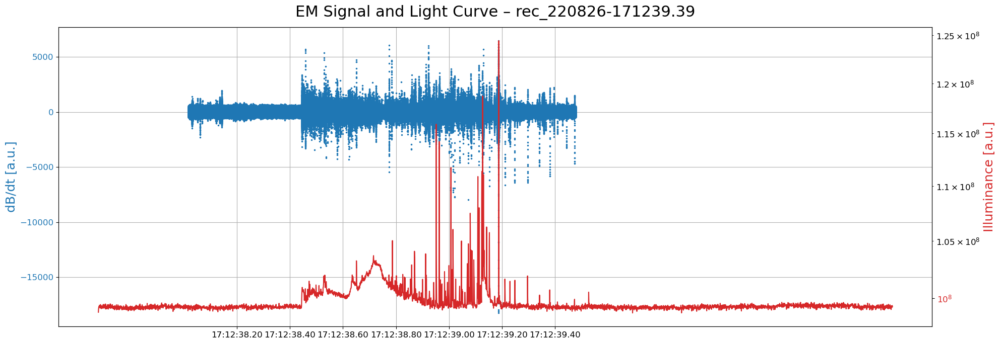

In [444]:
# --- VLF signál ---
filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/parallella-VLF/rec_220826-171239.39'
channel = 3

with open(filepath, 'rb') as file:
    fn = os.path.basename(filepath)
    h, samples, synclog = loadrec(file)
    t2s, s2t, xticker, xformatter = assign_time_axis(fn, h, synclog)

offset = -int(t2s(s2t(0)))
a = (h['preTrigger'] - h['preTrigger']) * h['descSpan'] // 16
b = (h['preTrigger'] + h['postTrigger']) * h['descSpan'] // 16
signal_samples = samples[a:b, channel]
sample_indices = np.arange(a + offset, b + offset)

# --- Světelná křivka ---
directory = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/chronos'
csv_files = list(glob.iglob(directory + "/*-39.*mp4.csv"))
if not csv_files:
    raise FileNotFoundError("CSV soubor s -39.*mp4.csv nebyl nalezen.")
csv_file = csv_files[0]

y = pd.read_csv(csv_file)
snaps = len(y)
tsnap = 1 / 1612.3
y['time'] = y.index * tsnap - snaps * tsnap / 2 - 365 * tsnap
y['abstime'] = pd.to_datetime('2022-08-26 17:12:39.402083') + pd.to_timedelta(y['time'], unit='s')

# Převod času na vzorkové indexy
y['sample_index'] = y['abstime'].apply(t2s)

# --- Vykreslení ---
fig, ax1 = plt.subplots(figsize=(20, 7))

# Primární osa Y: EM signál
ax1.plot(sample_indices, signal_samples, linestyle="", marker=".", alpha=1.0, markersize=3, label="EM signal", color="tab:blue")
ax1.set_ylabel("dB/dt [a.u.]", fontsize=18, color="tab:blue")
ax1.tick_params(axis='y', labelcolor="tab:blue")
ax1.xaxis.set_major_locator(xticker)
ax1.xaxis.set_major_formatter(xformatter)
ax1.set_title(f"VLF Signal and Light Curve – {os.path.basename(filepath)}", fontsize=22, pad=15)
ax1.grid(True)

# Sekundární osa Y: světelná křivka
ax2 = ax1.twinx()
ax2.plot(y['sample_index'], y['0'], color="tab:red", label="Light curve")
ax2.set_ylabel("Illuminance [a.u.]", fontsize=18, color="tab:red")
ax2.set_yscale('log')
ax2.tick_params(axis='y', labelcolor="tab:red")

# Osa X jako čas pomocí formatteru
ax1.tick_params(axis='x', labelsize=12)
plt.xticks(rotation=45)
plt.xlabel("Time [UTC]", fontsize=18)

plt.tight_layout()
plt.show()


In [447]:
import pandas as pd
import numpy as np
import requests
import io
import time
import json
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib
import statistics
import cartopy.geodesic as cgeo
import json
import os
import glob
import matplotlib.patches as patches
import matplotlib.patheffects as pe
import cartopy
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
from urllib.request import urlopen, Request
from PIL import Image
import shapely
from matplotlib.patches import Rectangle

# Haversine formula for calculating the distance between two points on a sphere
def haversine(lat1, lon1, lat2, lon2):
    R = 6371.0  # Earth's radius in km
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c

# Vectorizing the Haversine formula
vec_haversine = np.vectorize(haversine)


In [479]:
BLITZ_DIST = 80

lat=50.1522822 
lon=14.8593339

date ='2022-08-26'
sitename = 'Stary Vestec'
start=pd.Timestamp('2022-08-26 17:12:00')
end=pd.Timestamp('2022-08-26 17:12:41')


In [475]:
year, month, day = date.split('-')
day = day.strip().zfill(2)
month = month.strip().zfill(2)
year = year.strip()

fBlitz = '/storage/blitzortung/2021-2024/region-1/' +  year + '-' + month + '-' + day + '.log'

In [476]:
# Load of lightning data

blitz = pd.read_csv(fBlitz, sep=',', low_memory=False, on_bad_lines='skip')


In [477]:
# Reduction of distant lightnings

blitz['lonRad']=np.radians(blitz.lon)
blitz['latRad']=np.radians(blitz.lat)
lonRad=np.radians(lon)
latRad=np.radians(lat)
blitz['DlonRad']=lonRad-blitz.lonRad
blitz['DlatRad']=latRad-blitz.latRad
blitz['a']=np.sin(blitz.DlatRad/2.)**2. + np.cos(blitz.latRad) * np.cos(latRad) * np.sin(blitz.DlonRad/2.)**2.
blitz['km'] = 2. * np.arcsin(np.sqrt(blitz.a))*6378.
blitz = blitz.loc[blitz['km'] <= BLITZ_DIST]
blitz.reset_index(inplace=True)
blitz.reset_index(inplace=True)
blitz['time']=pd.to_datetime(blitz['time'])
blitz.set_index('time', inplace=True, drop=False)


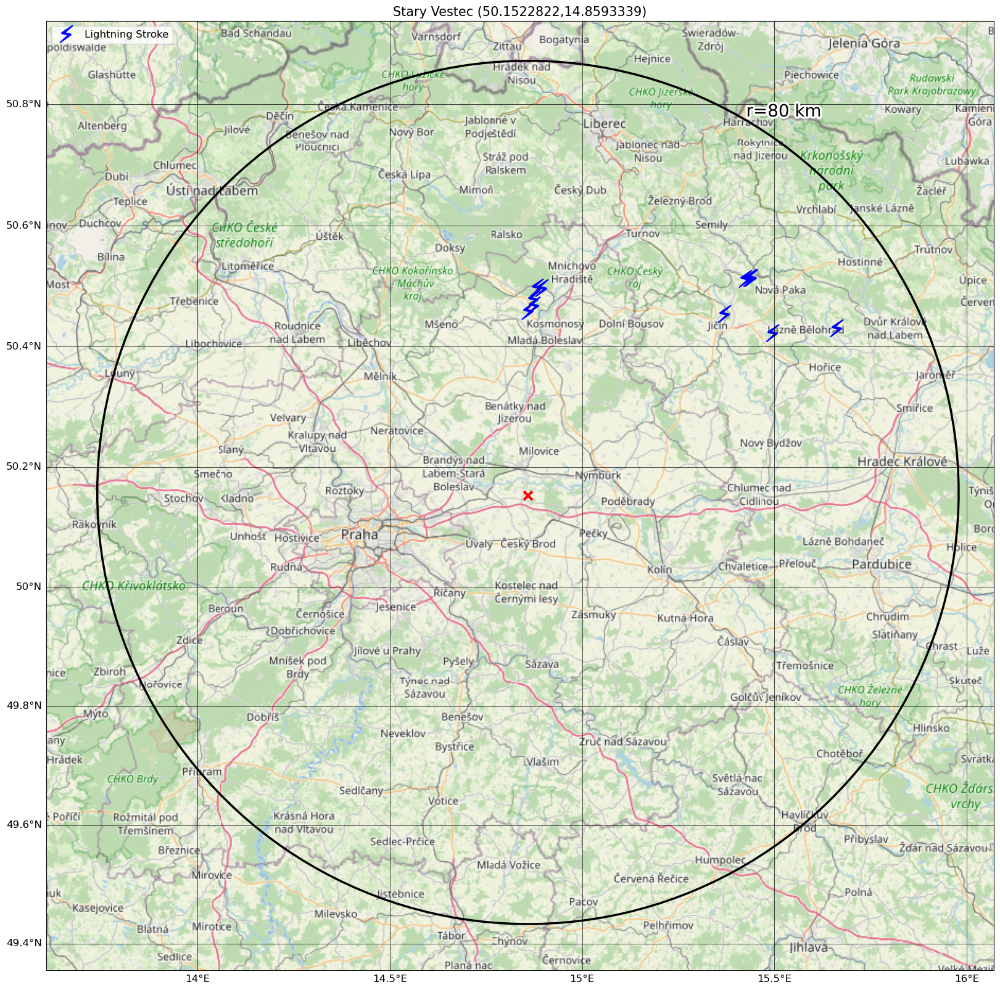

In [481]:
__title__   = 'Plot OpenStreetMap site map'
__version__ = 'v1.0 (2021-03-02)'
__author__  = 'Mathew Lipson'
__email__   = 'm.lipson@unsw.edu.au'

projpath = '.'

##########################################################################

def main():

    RADIUS = BLITZ_DIST * 1000
    
    # style can be 'map' or 'satellite'

    #for style in ['map','satellite']:

    '''
    for i in range(0,max(blitz.index)+1):
        bl = blitz.loc[blitz.index<=i]
        print(i,' ', end='')
        osm_image(bl,i,lon, lat, sitename=sitename, style='map', radius=RADIUS)
    '''
    start = pd.Timestamp('2022-08-26 17:12:00')
    end = pd.Timestamp('2022-08-26 17:12:40')
    #start = pd.Timestamp('2022-08-26 17:12:39.10')
    #end = pd.Timestamp('2022-08-26 17:12:40')

    # Redukce dat
    bl = blitz[(blitz.index >= start) & (blitz.index <= end)].copy()

    #.loc[blitz.index<=max(blitz.index)+1]
    #print(max(blitz.index)+1,'lightning')
    osm_image(bl,0,lon, lat, sitename=sitename, style='map', radius=RADIUS)

    return

##########################################################################

def osm_image(bl,i,lon,lat,sitename='xxxx',style='satellite',radius=500):

    if style=='map':
        ## MAP STYLE
        cimgt.OSM.get_image = image_spoof # reformat web request for street map spoofing
        img = cimgt.OSM() # spoofed, downloaded street map
    elif style =='satellite':
        # SATELLITE STYLE
        cimgt.QuadtreeTiles.get_image = image_spoof # reformat web request for street map spoofing
        img = cimgt.QuadtreeTiles() # spoofed, downloaded street map
    else:
        print('no valid style')

    stroke = [pe.Stroke(linewidth=1, foreground='w'), pe.Normal()]

    ############################################################################

    plt.close('all')
    fig = plt.figure(figsize=(20,20)) # open matplotlib figure
    ax = plt.axes(projection=img.crs) # project using coordinate reference system (CRS) of street map
    data_crs = ccrs.PlateCarree()

    ax.set_title(f'{sitename} ({lat},{lon})',fontsize=15)

    # auto-calculate scale
    #scale = int(120/np.log(radius))
    scale = int(115/np.log(radius))
    scale = (scale<20) and scale or 19

    scale = 9
    
    # or change scale manually
    # NOTE: scale specifications should be selected based on radius
    # but be careful not have both large scale (>16) and large radius (>1000), 
    #  it is forbidden under [OSM policies](https://operations.osmfoundation.org/policies/tiles/)
    # -- 2     = coarse image, select for worldwide or continental scales
    # -- 4-6   = medium coarseness, select for countries and larger states
    # -- 6-10  = medium fineness, select for smaller states, regions, and cities
    # -- 10-12 = fine image, select for city boundaries and zip codes
    # -- 14+   = extremely fine image, select for roads, blocks, buildings

    extent = calc_extent(lon,lat,radius*1.1)
    ax.set_extent(extent) # set extents
    ax.add_image(img, int(scale)) # add OSM with zoom specification

    # add site
    ax.plot(lon,lat, color='red', marker='x', ms=10, mew=3, transform=data_crs)
    #ax.plot(lon,lat, color='black', marker='x', ms=15, mew=2, transform=data_crs)
    
    #lightning = blitz.loc['2021-08-15 16:00:00':'2021-08-15 20:00:00']
    #lightning = blitz.loc['2023-07-06 11:30':'2023-07-06 11:40']
    #ax.plot(lightning.lon,lightning.lat,color='blue',lw=0,marker='$\u21AF$',ms=25,mew=1.0,transform=data_crs)
    #ax.plot(lightning.lon,lightning.lat,color='black',lw=0,marker='$\u26A1$',ms=35,mew=1.0,transform=data_crs)
    ax.plot(bl.loc[bl.index==i].lon,bl.loc[bl.index==i].lat,color='cyan',lw=0,marker='o',ms=60,mew=1.0,transform=data_crs)
    ax.plot(bl.lon,bl.lat,color='blue',lw=0,marker='$\u26A1$',ms=20,mew=1.0,transform=data_crs, label='Lightning Stroke')

    #t = ax.text(11.6, 49.75, str(bl.iloc[-1].time)[:-8], color='black', fontsize=20, ha='left',va='bottom', path_effects=stroke, transform=data_crs)
    #t.set_bbox(dict(facecolor='white', alpha=0.75, linewidth=0))
    #no = ax.text(11.6, 49.8, str(bl.index[-1]+1), color='black', fontsize=20, ha='left',va='bottom', path_effects=stroke, transform=data_crs)
    #no.set_bbox(dict(facecolor='white', alpha=0.75, linewidth=0))
    
    

    # Identify lightning with nearby structures

   
    # Cas jednotlivych bodu
    #for index, row in lightning.iterrows():
    #    ax.text(row.lon, row.lat, row.UTC, color='red', fontsize=10, ha='left',va='bottom', transform=data_crs)


    # add cartopy geodesic circle
    circle_points = cgeo.Geodesic().circle(lon=lon, lat=lat, radius=radius)
    geom = shapely.geometry.Polygon(circle_points)
    ax.add_geometries((geom,), crs=ccrs.PlateCarree(), edgecolor='black', facecolor='none', linewidth=2.5)

    radius_text = cgeo.Geodesic().direct(points=(lon,lat),azimuths=30,distances=radius)[:,0:2][0]
    stroke = [pe.Stroke(linewidth=5, foreground='w'), pe.Normal()]
    ax.text(radius_text[0],radius_text[1],f'r={int(radius/1000)} km', color='black', 
        fontsize=20, ha='left',va='bottom', path_effects=stroke, transform=data_crs)

    gl = ax.gridlines(draw_labels=True, crs=data_crs,
                        color='k',lw=0.5)

    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = cartopy.mpl.gridliner.LONGITUDE_FORMATTER
    gl.yformatter = cartopy.mpl.gridliner.LATITUDE_FORMATTER

    plt.legend(loc=2)

    #plt.show()

    #fig.savefig(f'./animation/'+str(i)+'.png', dpi=150, bbox_inches='tight')
    #fig.savefig(f'/storage/experiments/2024/vetrniky/animation/'+str(i)+'.png', dpi=150, bbox_inches='tight')

    return

def calc_extent(lon,lat,dist):
    '''This function calculates extent of map
    Inputs:
        lat,lon: location in degrees
        dist: dist to edge from centre
    '''

    dist_cnr = np.sqrt(2*dist**2)
    top_left = cgeo.Geodesic().direct(points=(lon,lat),azimuths=-45,distances=dist_cnr)[:,0:2][0]
    bot_right = cgeo.Geodesic().direct(points=(lon,lat),azimuths=135,distances=dist_cnr)[:,0:2][0]

    extent = [top_left[0], bot_right[0], bot_right[1], top_left[1]]

    return extent

def image_spoof(self, tile):
    '''this function reformats web requests from OSM for cartopy
    Heavily based on code by Joshua Hrisko at:
        https://makersportal.com/blog/2020/4/24/geographic-visualizations-in-python-with-cartopy'''

    url = self._image_url(tile)                # get the url of the street map API
    req = Request(url)                         # start request
    req.add_header('User-agent','Anaconda 3')  # add user agent to request
    fh = urlopen(req) 
    im_data = io.BytesIO(fh.read())            # get image
    fh.close()                                 # close url
    img = Image.open(im_data)                  # open image with PIL
    img = img.convert(self.desired_tile_form)  # set image format
    return img, self.tileextent(tile), 'lower' # reformat for cartopy

if __name__ == "__main__":

   main()

In [488]:
start = pd.Timestamp('2022-08-26 17:12:00')
end = pd.Timestamp('2022-08-26 17:12:50')
#start = pd.Timestamp('2022-08-26 17:12:39.10')
#end = pd.Timestamp('2022-08-26 17:12:40')

# Redukce dat
bl = blitz[(blitz.index >= start) & (blitz.index <= end)].copy()
bl

,level_0,index,time,lat,lon,lonRad,latRad,DlonRad,DlatRad,a,km
time,,,,,,,,,,,
2022-08-26 17:12:02.668472702,1751,49798,2022-08-26 17:12:02.668472702,50.459193,14.859530,0.259348,0.880679,-0.000003,-0.005357,0.000007,34.164423
2022-08-26 17:12:02.668477751,1752,49799,2022-08-26 17:12:02.668477751,50.479102,14.873154,0.259586,0.881027,-0.000241,-0.005704,0.000008,36.393893
2022-08-26 17:12:32.463699751,1753,49818,2022-08-26 17:12:32.463699751,50.497851,14.882299,0.259745,0.881354,-0.000401,-0.006031,0.000009,38.502323
2022-08-26 17:12:32.623276044,1754,49825,2022-08-26 17:12:32.623276044,50.454620,15.370195,0.268261,0.880599,-0.008916,-0.005277,0.000015,49.517565
2022-08-26 17:12:32.658845928,1755,49828,2022-08-26 17:12:32.658845928,50.496993,14.895442,0.259975,0.881339,-0.000630,-0.006016,0.000009,38.457916
2022-08-26 17:12:32.682141467,1756,49830,2022-08-26 17:12:32.682141467,50.468672,14.874317,0.259606,0.880844,-0.000262,-0.005522,0.000008,35.235698
2022-08-26 17:12:32.883508886,1757,49833,2022-08-26 17:12:32.883508886,50.513394,15.434713,0.269387,0.881625,-0.010042,-0.006303,0.000020,57.335673
2022-08-26 17:12:32.883515607,1758,49834,2022-08-26 17:12:32.883515607,50.514102,15.440653,0.269490,0.881637,-0.010146,-0.006315,0.000020,57.692168
2022-08-26 17:12:32.931853535,1759,49835,2022-08-26 17:12:32.931853535,50.512933,15.423510,0.269191,0.881617,-0.009847,-0.006295,0.000020,56.734605


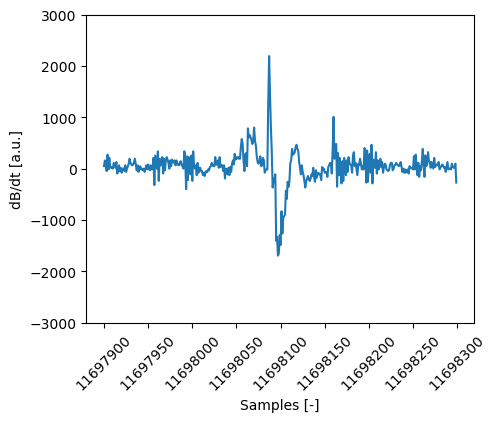

In [120]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np

# --- Funkce pro blokové průměrování ---
def block_average_decimate(signal, factor):
    length = len(signal) - len(signal) % factor  # zarovná na celé bloky
    reshaped = signal[:length].reshape(-1, factor)
    return reshaped.mean(axis=1)

# --- Výběr úseku signálu ---
start = 11_697_900
end = 11_698_300
segment = signal_samples[start:end]

# --- Decimace s průměrováním ---
factor = 1
aligned_length = len(segment) - len(segment) % factor
segment = segment[:aligned_length]
decimated = block_average_decimate(segment, factor)

# --- Odpovídající X osa pro decimovaný signál ---
x_decimated = np.linspace(start, start + aligned_length, len(decimated), endpoint=False)


# --- Vykreslení ---
plt.figure(figsize=(5, 4))
plt.rcParams.update({'font.size': 10})

plt.plot(x_decimated, decimated)
plt.ylim(-3000, 3000)

ax = plt.gca()
formatter = ticker.ScalarFormatter(useOffset=False, useMathText=False)
formatter.set_scientific(False)
ax.xaxis.set_major_formatter(formatter)
plt.xticks(rotation=45)

plt.xlabel("Samples [-]")
plt.ylabel("dB/dt [a.u.]")

plt.show()


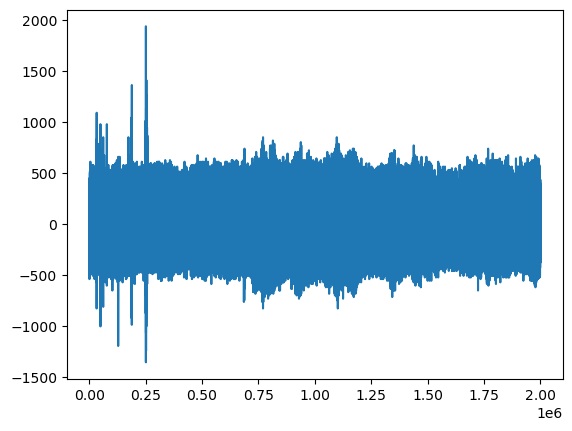

In [5]:
from ipywidgets import interact
import networkx as nx
#interact(factorit, n=(2,40))

%matplotlib inline
plt.plot(signal_samples[int(1e6):int(3e6)])

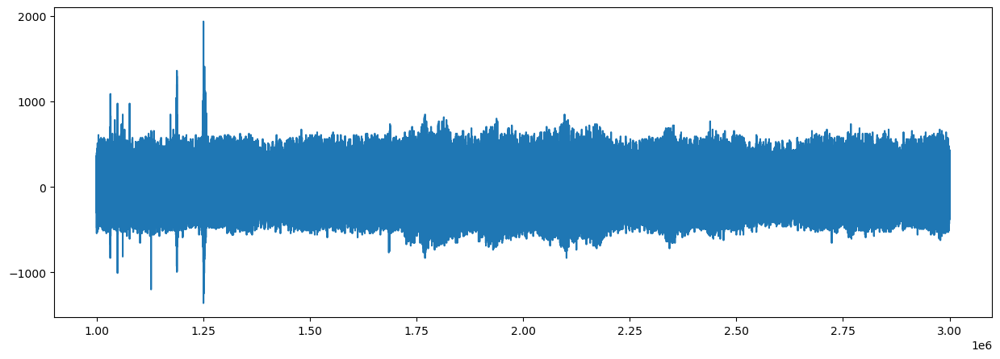

interactive(children=(IntSlider(value=2000000, description='center', layout=Layout(width='800px'), max=3000000…

<function __main__.plot_graph(center, zoom)>

In [6]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets


def plot_graph(center, zoom):
    fig, (ax) = plt.subplots(nrows=1, sharex=True, figsize=(15,5))
    plt.rcParams.update({'font.size': 20})
    ax.plot(range(center-zoom,center+zoom),signal_samples[center-zoom:center+zoom])
    plt.show()
    
interact(plot_graph, center=widgets.IntSlider(min=int(1e6), max=int(3e6), step=1, value=int(2e6), layout=widgets.Layout(width='800px')), zoom=widgets.IntSlider(min=int(10), max=int(1e6), step=1, value=int(1e6), layout=widgets.Layout(width='800px')))

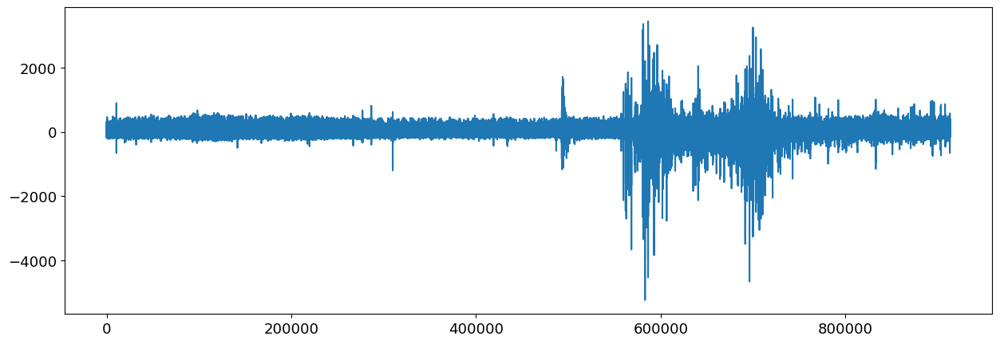

interactive(children=(IntSlider(value=0, description='fromxzoom', layout=Layout(width='800px'), max=3653632), …

interactive(children=(IntSlider(value=0, description='fromx', layout=Layout(width='800px'), max=14604528), Int…

<function __main__.plot_graph(fromx, samples)>

In [6]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets


plt.rcParams.update({'font.size': 13})
fig, (ax) = plt.subplots(nrows=1, sharex=True, figsize=(15,1))
#plt.ticklabel_format(axis='both', style='sci', scilimits=(0,0))
ax.plot(signal_samples)
plt.show()

def plot_graph_zoom(fromxzoom, sampleszoom):
    fig, (ax) = plt.subplots(nrows=1, sharex=True, figsize=(15,5))
    ax.plot(range(fromxzoom,fromxzoom+sampleszoom), signal_samples[fromxzoom:fromxzoom+sampleszoom])
    plt.show()
    
def plot_graph(fromx, samples):
    if ((fromx+samples)>len(signal_samples)):
        samples = len(signal_samples)-fromx
    fig, (ax) = plt.subplots(nrows=1, sharex=True, figsize=(15,2))
    ax.plot(range(fromx,fromx+samples), signal_samples[fromx:fromx+samples])
    plt.show()
    interact(plot_graph_zoom, 
             fromxzoom=widgets.IntSlider(min=fromx, max=fromx+samples, step=1, value=fromx, layout=widgets.Layout(width='800px')), 
             sampleszoom=widgets.IntSlider(min=1000, max=int(samples/4), step=1, value=int(samples/4), layout=widgets.Layout(width='800px')), 
            )
    
interact(plot_graph, 
         fromx=widgets.IntSlider(min=0, max=len(signal_samples)-10000, step=1, value=0, layout=widgets.Layout(width='800px')), 
         samples=widgets.IntSlider(min=10000, max=int(len(signal_samples)/4), step=1, value=int(len(signal_samples)/4), layout=widgets.Layout(width='800px')), 
        )

In [65]:
len(signal_samples)

14614528

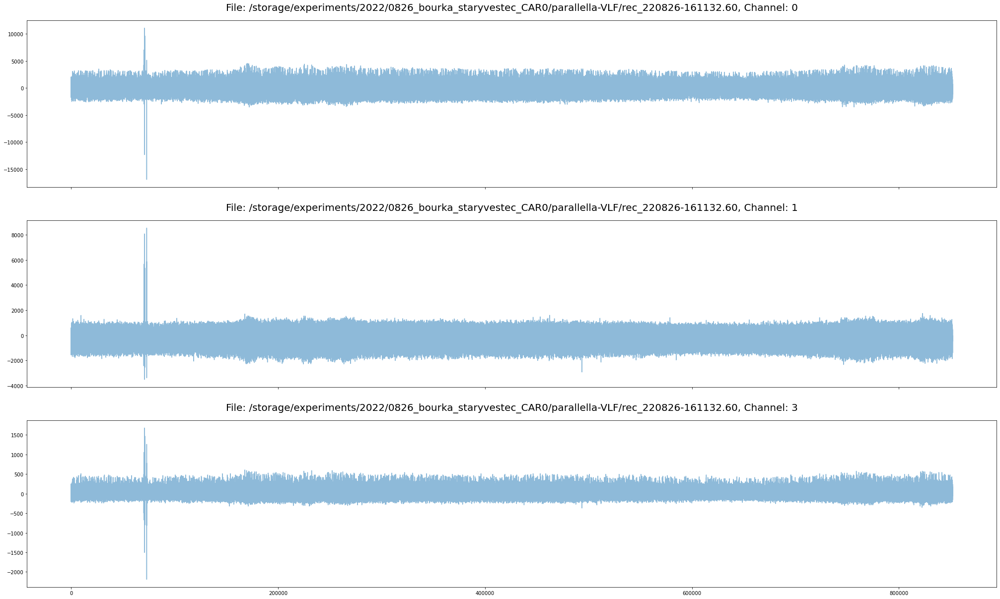

In [2]:
import matplotlib.pyplot as plt
import os

# Předpokládáme, že 'loadrec' a 'assign_time_axis' jsou definovány v externím modulu
from readrec import loadrec, assign_time_axis

filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR2/parallella-VLF/rec_220826-161131.74'
filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/parallella-VLF/rec_220826-161132.60'

channels = [0, 1, 3]
nrows = len(channels)
fig, axs = plt.subplots(figsize=(35, 7 * nrows), nrows=nrows, sharex=True)

data = []

# Nahrání a zpracování dat
with open(filepath, 'rb') as file:
    fn = os.path.basename(filepath)
    h, samples, synclog = loadrec(file)
    t2s, s2t, ticker, formatter = assign_time_axis(fn, h, synclog)

    time = s2t(0)

    # Přidání dat do seznamu pro pozdější zpracování
    data.append((filepath, h, samples, synclog, t2s, s2t, ticker, formatter))

# Vykreslení dat
for i, (filepath, h, samples, synclog, t2s, s2t, ticker, formatter) in enumerate(data):
    a = h['preTrigger'] * h['descSpan'] // 16
    b = (h['preTrigger'] + h['postTrigger']) * h['descSpan'] // 16
    time_a = s2t(a)
    time_b = s2t(b - 1)

    for ax, ch in zip(axs, channels):
        signal_samples = samples[a:b, ch]

        # Nastavení rozsahu a značek na ose x
        #ax.set_xlim(time_a, time_b)

        ax.set_title(f"File: {filepath}, Channel: {ch}", fontsize=20, pad=20)
        #ax.plot(range(a, b), signal_samples, linestyle="", marker=".", alpha=0.5, markersize=1)
        ax.plot(signal_samples,  alpha=0.5, markersize=1)

plt.show()


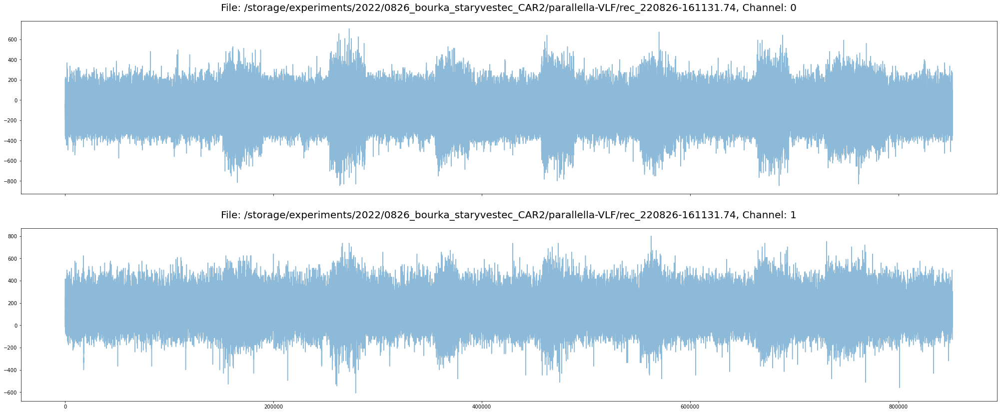

In [15]:
import matplotlib.pyplot as plt
import os

# Předpokládáme, že 'loadrec' a 'assign_time_axis' jsou definovány v externím modulu
from readrec import loadrec, assign_time_axis

filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR2/parallella-VLF/rec_220826-161131.74'

channels = [0,1]
nrows = len(channels)
fig, axs = plt.subplots(figsize=(35, 7 * nrows), nrows=nrows, sharex=True)

data = []

# Nahrání a zpracování dat
with open(filepath, 'rb') as file:
    fn = os.path.basename(filepath)
    h, samples, synclog = loadrec(file)
    t2s, s2t, ticker, formatter = assign_time_axis(fn, h, synclog)

    time = s2t(0)

    # Přidání dat do seznamu pro pozdější zpracování
    data.append((filepath, h, samples, synclog, t2s, s2t, ticker, formatter))

# Vykreslení dat
for i, (filepath, h, samples, synclog, t2s, s2t, ticker, formatter) in enumerate(data):
    a = h['preTrigger'] * h['descSpan'] // 16
    b = (h['preTrigger'] + h['postTrigger']) * h['descSpan'] // 16
    time_a = s2t(a)
    time_b = s2t(b - 1)

    for ax, ch in zip(axs, channels):
        signal_samples = samples[a:b, ch]

        # Nastavení rozsahu a značek na ose x
        #ax.set_xlim(time_a, time_b)

        ax.set_title(f"File: {filepath}, Channel: {ch}", fontsize=20, pad=20)
        #ax.plot(range(a, b), signal_samples, linestyle="", marker=".", alpha=0.5, markersize=1)
        ax.plot(signal_samples,  alpha=0.5, markersize=1)

plt.show()


In [ ]:
import datetime
base = datetime.datetime.today()
plt.plot([base - datetime.timedelta(microseconds=x) for x in range(len(samples))],samples[:,0])

In [75]:
# Load of lightning data

blitz = pd.read_csv('/storage/blitzortung/2021-2023/region-1/2022-08-26.log', sep=',', low_memory=False, on_bad_lines='skip')

lat=50.1528464
lon=14.8556861

start=pd.Timestamp('2022-08-26 16:08:00') 
end=pd.Timestamp('2022-08-26 16:10:00')

start=pd.Timestamp('2022-08-26 16:04:00') 
end=pd.Timestamp('2022-08-26 17:41:00')

start=pd.Timestamp('2022-08-26 15:00:00') 
end=pd.Timestamp('2022-08-26 19:00:00')

#start=pd.Timestamp('2022-08-26 16:30:21') 
#end=pd.Timestamp('2022-08-26 16:30:23')

BLITZ_DIST = 200

In [76]:
# reduction lightning for given time

blitz['time'] = pd.to_datetime(blitz['time'])
blitz = blitz.loc[blitz['time']>start].loc[blitz['time']<end]

# Reduction of distant lightnings

blitz['lonRad']=np.radians(blitz.lon)
blitz['latRad']=np.radians(blitz.lat)
lonRad=np.radians(lon)
latRad=np.radians(lat)
blitz['DlonRad']=lonRad-blitz.lonRad
blitz['DlatRad']=latRad-blitz.latRad
blitz['a']=np.sin(blitz.DlatRad/2.)**2. + np.cos(blitz.latRad) * np.cos(latRad) * np.sin(blitz.DlonRad/2.)**2.
blitz['km'] = 2. * np.arcsin(np.sqrt(blitz.a))*6378.
blitz = blitz.loc[blitz['km'] <= BLITZ_DIST]
blitz.reset_index(inplace=True)

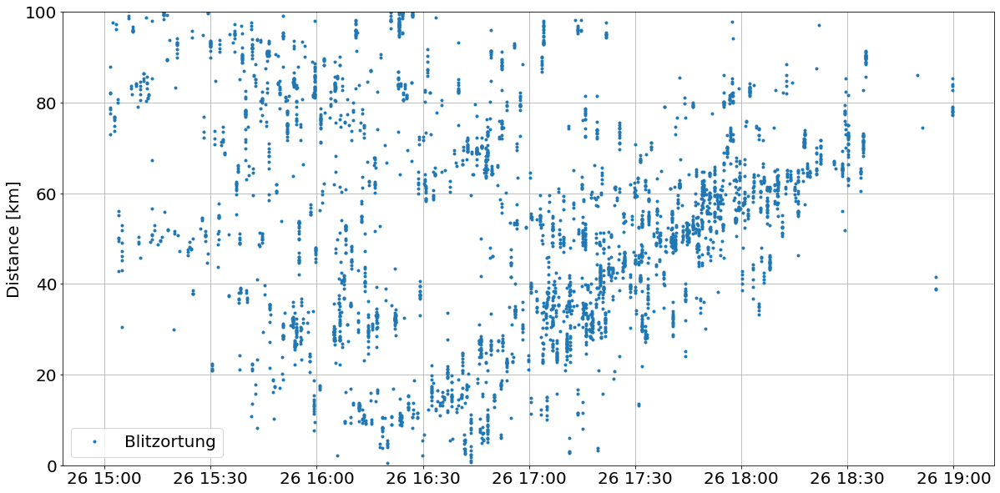

In [77]:
fig, (ax6) = plt.subplots(nrows=1, sharex=True, figsize=(20,10))
plt.rcParams.update({'font.size': 20})

ax6.plot(blitz.time, blitz.km, ls='', marker='.', label='Blitzortung')
ax6.set_ylabel('Distance [km]')
ax6.set_ylim(0,100)
ax6.grid()
#ax6.vlines(x=gps['timeR'], ymin=0, ymax=130, color='red', label='Trigger STP', lw=1, linestyle='-', alpha=0.3)
ax6.legend()
plt.rcParams.update({'font.size': 20})


In [11]:
import re
import os
import pandas as pd
from readrec import loadrec, assign_time_axis  # Ensure this import is at the top of your file


filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR2/parallella-VLF/rec_220826-163022.70'
filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR2/parallella-VLF/rec_220826-160903.93'
#filepath = '/storage/experiments/2022/0826_bourka_staryvestec_CAR2/parallella-VLF/rec_220826-161131.74'
         
selected_channels = [0, 1, 3] # Selection of channels with antenna connected


with open(filepath, 'rb') as file:
    fn = os.path.basename(filepath)
    h, samples, synclog = loadrec(file)  # Use actual loadrec function
    t2s, s2t, _, _ = assign_time_axis(fn, h, synclog)  # Use actual assign_time_axis function

    # Use the s2t function to create timestamps for all samples
    timestamps = pd.date_range(start=s2t(0), periods=samples.shape[0], freq=pd.to_timedelta(1/sps, unit='s'))
    combined_data = pd.DataFrame(samples[:, selected_channels], index=timestamps, columns=[f'Channel_{ch}' for ch in selected_channels])


    
 

NameError: name 'trigger' is not defined

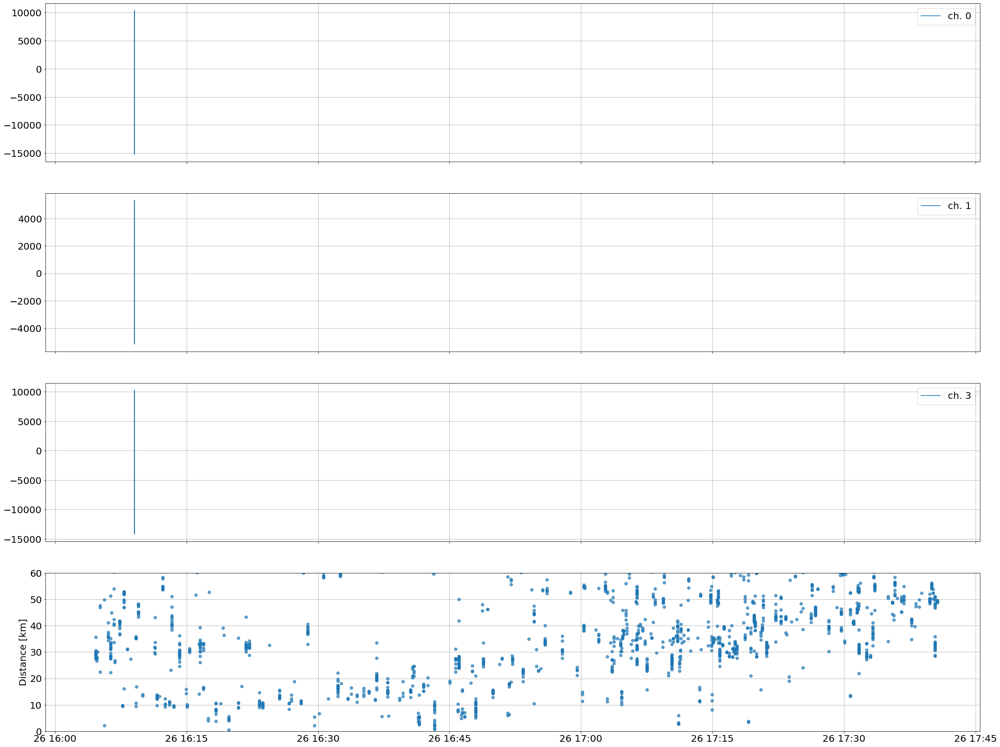

In [13]:


channels = [0, 1, 3]

nrows = 3 + 1
fig, axs = plt.subplots(figsize=(35, 7 * nrows), nrows=nrows, sharex=True)
matplotlib.rcParams.update({'font.size': 20})

mintime = None
data = []

# Render data
ax_idx = 0

for ch in channels:
    axs[ax_idx].plot(combined_data.iloc[:,ax_idx], label='ch. '+str(ch))
    axs[ax_idx].grid()
    axs[ax_idx].legend()
    
    ax_idx += 1

    

axs[ax_idx].plot(blitz.time + pd.to_timedelta(-18, unit='s'), blitz.km, ls='', marker='o', label='Blitzortung', alpha=0.7)
axs[ax_idx].set_ylabel('Distance [km]')
axs[ax_idx].set_ylim(0,60)
axs[ax_idx].grid()
axs[ax_idx].vlines(x=trigger['time'], ymin=0, ymax=60, color='red', label='Trigger STP', lw=1, linestyle='-', alpha=0.3)
axs[ax_idx].legend()

plt.show()


In [4]:
fn = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/triggers.csv'

trigger = pd.read_csv(fn, sep=';', header=None, comment='*', low_memory=False)

trigger['time'] = pd.to_datetime(trigger[1])

trigger = trigger.loc[trigger['time']>start].loc[trigger['time']<end]


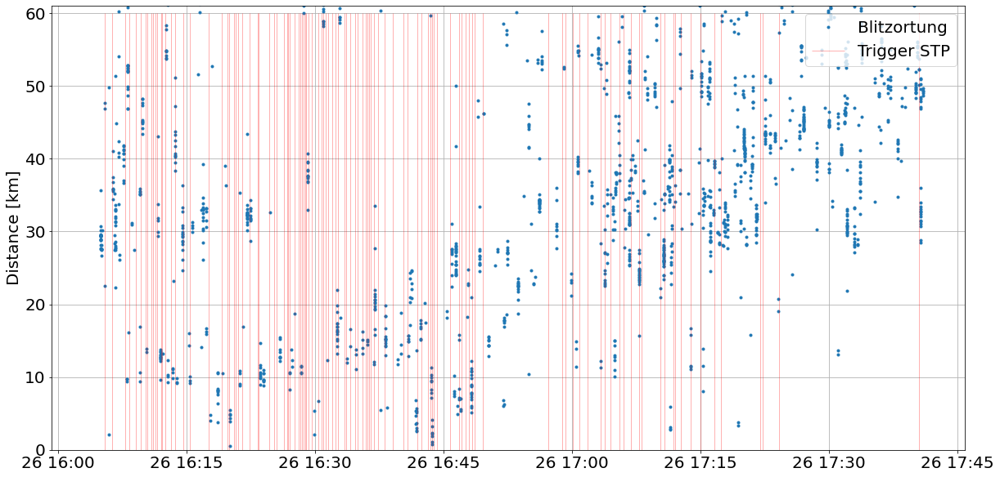

In [8]:
fig, (ax6) = plt.subplots(nrows=1, sharex=True, figsize=(20,10))
plt.rcParams.update({'font.size': 20})

ax6.plot(blitz.time, blitz.km, ls='', marker='.', label='Blitzortung')
ax6.set_ylabel('Distance [km]')
ax6.set_ylim(0,61)
ax6.grid()
ax6.vlines(x=trigger['time'], ymin=0, ymax=60, color='red', label='Trigger STP', lw=1, linestyle='-', alpha=0.3)
ax6.legend(loc=1)
plt.rcParams.update({'font.size': 20})


In [215]:
directory = '/storage/experiments/2022/0826_bourka_staryvestec_CAR2/parallella-VLF'

numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

records2=pd.DataFrame()

sn = '0'
files = sorted(glob.iglob(directory + '/*.??'), key=numericalSort)
for file in files:
    filetime = file.split('/')[-1].split('_')[-1]
    #print(filetime)
    #print(pd.to_datetime(filetime))
    #record['time'] = pd.to_datetime(filetime)
    record = pd.DataFrame({'time':[pd.to_datetime(filetime,format='%y%m%d-%H%M%S.%f')]})
    records2 = pd.concat([records2,record], ignore_index=True)

records2 = records2.loc[records2['time']>start].loc[records2['time']<end]

print('All files was readed.')

All files was readed.


In [219]:
directory = '/storage/experiments/2022/0826_bourka_staryvestec_CAR1/parallella'

numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

records1=pd.DataFrame()

sn = '0'
files = sorted(glob.iglob(directory + '/*.??'), key=numericalSort)
for file in files:
    filetime = file.split('/')[-1].split('_')[-1]
    #print(filetime)
    #print(pd.to_datetime(filetime))
    #record['time'] = pd.to_datetime(filetime)
    record = pd.DataFrame({'time':[pd.to_datetime(filetime,format='%y%m%d-%H%M%S.%f')]})
    records1 = pd.concat([records1,record], ignore_index=True)

records1 = records1.loc[records1['time']>start].loc[records1['time']<end]

print('All files was readed.')

All files was readed.


In [217]:
directory = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/parallella-VLF'

numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

records0=pd.DataFrame()

sn = '0'
files = sorted(glob.iglob(directory + '/*.??'), key=numericalSort)
for file in files:
    filetime = file.split('/')[-1].split('_')[-1]
    #print(filetime)
    #print(pd.to_datetime(filetime))
    #record['time'] = pd.to_datetime(filetime)
    record = pd.DataFrame({'time':[pd.to_datetime(filetime,format='%y%m%d-%H%M%S.%f')]})
    records0 = pd.concat([records0,record], ignore_index=True)

records0 = records0.loc[records0['time']>start].loc[records0['time']<end]

print('All files was readed.')

All files was readed.


In [161]:
directory = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/chronos'

numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

videos0=pd.DataFrame()

sn = '0'
files = sorted(glob.iglob(directory + '/*.mp4'), key=numericalSort)
for file in files:
    filetime = file.split('/')[-1].split('-l')[-2]
    #print(filetime)
    #print(pd.to_datetime(filetime))
    #record['time'] = pd.to_datetime(filetime)
    video = pd.DataFrame({'time':[pd.to_datetime(filetime ,format='%Y-%m-%d-%H-%M-%S.%f')]})
    videos0 = pd.concat([videos0,video], ignore_index=True)

videos0 = videos0.loc[videos0['time']>start].loc[videos0['time']<end]

print('All files was readed.')

All files was readed.


In [162]:
directory = '/storage/experiments/2022/0826_bourka_staryvestec_CAR1/chronos'

numbers = re.compile(r'(\d+)')
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts

videos1=pd.DataFrame()

sn = '0'
files = sorted(glob.iglob(directory + '/*-lightning.mp4'), key=numericalSort)
for file in files:
    #print(file)
    filetime = file.split('/')[-1].split('-l')[-2]
    #print(filetime)
    #print(pd.to_datetime(filetime))
    #record['time'] = pd.to_datetime(filetime)
    video = pd.DataFrame({'time':[pd.to_datetime(filetime ,format='%Y-%m-%d-%H-%M-%S.%f')]})
    videos1 = pd.concat([videos1,video], ignore_index=True)

videos1 = videos1.loc[videos1['time']>start].loc[videos1['time']<end]

print('All files was readed.')

All files was readed.


In [152]:
filetime

'2022-08-26-17-57-38.697934'

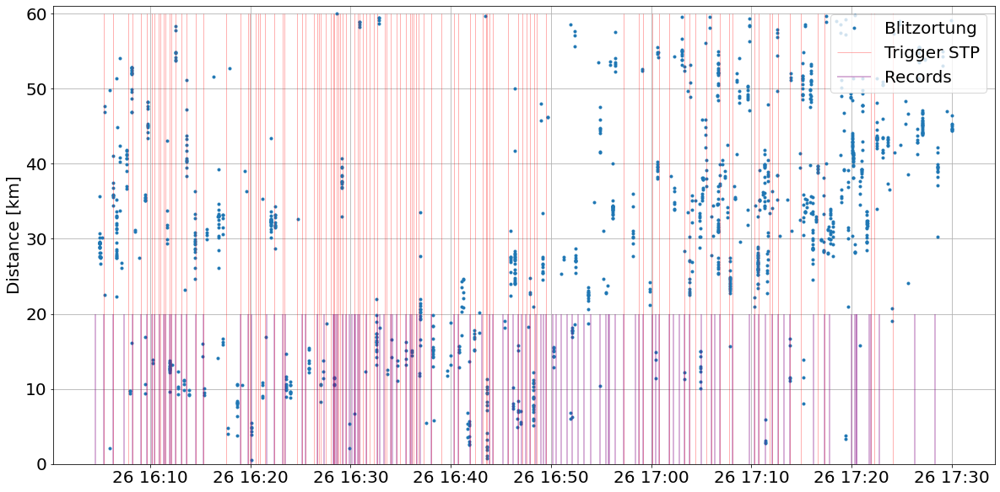

In [98]:
fig, (ax6) = plt.subplots(nrows=1, sharex=True, figsize=(20,10))
plt.rcParams.update({'font.size': 20})

ax6.plot(blitz.time, blitz.km, ls='', marker='.', label='Blitzortung')
ax6.set_ylabel('Distance [km]')
ax6.set_ylim(0,61)
ax6.grid()
ax6.vlines(x=trigger['time'], ymin=0, ymax=60, color='red', label='Trigger STP', lw=1, linestyle='-', alpha=0.3)
ax6.vlines(x=records['time'], ymin=0, ymax=20, color='purple', label='Records', lw=2, linestyle='-', alpha=0.3)
ax6.legend(loc=1)
plt.rcParams.update({'font.size': 20})


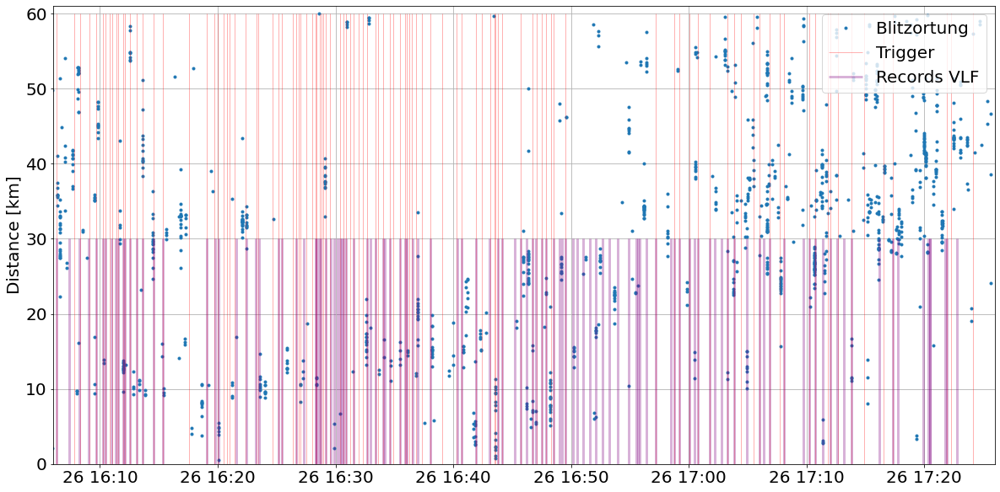

In [108]:
fig, (ax6) = plt.subplots(nrows=1, sharex=True, figsize=(20,10))
plt.rcParams.update({'font.size': 20})

ax6.plot(blitz.time, blitz.km, ls='', marker='.', label='Blitzortung')
ax6.set_ylabel('Distance [km]')
ax6.set_ylim(0,61)
ax6.grid()
ax6.vlines(x=trigger['time'], ymin=0, ymax=60, color='red', label='Trigger', lw=1, linestyle='-', alpha=0.3)
ax6.vlines(x=records['time'], ymin=0, ymax=30, color='purple', label='Records VLF', lw=3, linestyle='-', alpha=0.3)
ax6.legend(loc=1)
ax6.set_xlim(pd.Timestamp('2022-08-26 16:06:00'),pd.Timestamp('2022-08-26 17:26:00'))
plt.rcParams.update({'font.size': 20})


NameError: name 'records0' is not defined

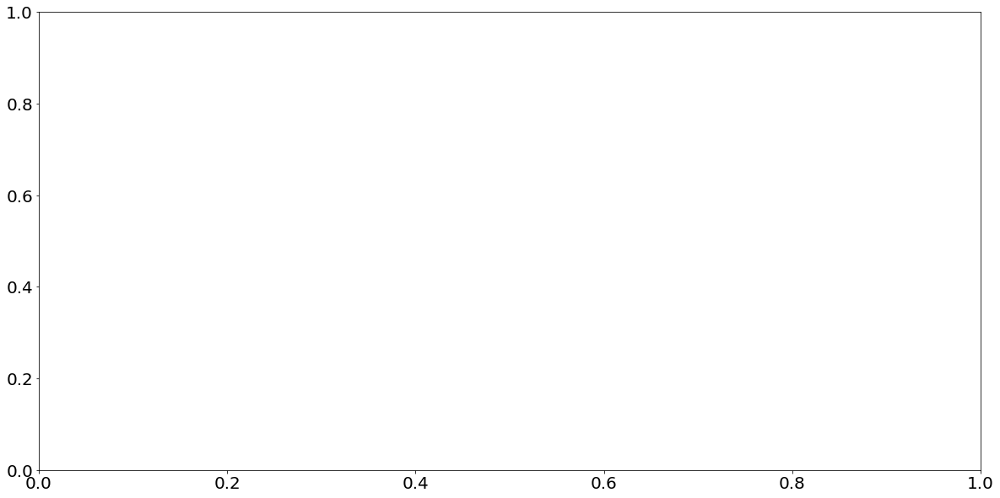

In [10]:
fig, (ax6) = plt.subplots(nrows=1, sharex=True, figsize=(20,10))
plt.rcParams.update({'font.size': 20})

#ax6.vlines(x=trigger['time'], ymin=0, ymax=60, color='red', label='Trigger', lw=1, linestyle='-', alpha=0.5)
ax6.vlines(x=records0['time'], ymin=10, ymax=20, color='orange', label='Records0', lw=2, linestyle='-', alpha=0.9)
ax6.vlines(x=records1['time'], ymin=20, ymax=30, color='purple', label='Records1', lw=2, linestyle='-', alpha=0.9)
ax6.vlines(x=records2['time'], ymin=30, ymax=60, color='brown', label='Records2', lw=2, linestyle='-', alpha=0.9)
ax6.vlines(x=videos0['time'], ymin=0, ymax=5, color='red', label='Videos0', lw=2, linestyle='-', alpha=0.9)
ax6.vlines(x=videos1['time'], ymin=5, ymax=10, color='green', label='Videos1', lw=2, linestyle='-', alpha=0.9)
ax6.plot(blitz.time + pd.to_timedelta(-0, unit='s'), blitz.km, ls='', marker='.', color='blue', label='Blitzortung')
ax6.set_ylabel('Distance [km]')
ax6.set_ylim(0,61)
ax6.grid()
ax6.legend(loc=1)
ax6.set_xlim(pd.Timestamp('2022-08-26 16:10:00'),pd.Timestamp('2022-08-26 17:30:00'))
#ax6.set_xlim(pd.Timestamp('2022-08-26 16:00:00'),pd.Timestamp('2022-08-26 16:10:00'))
plt.rcParams.update({'font.size': 20})


In [538]:
fn = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/triggers.csv'

start = pd.Timestamp('2022-08-26 17:12:00')
end = pd.Timestamp('2022-08-26 17:12:45')

#trigger0 = pd.read_csv(fn, sep=';', header=None, comment='*', low_memory=False)

#trigger0['time'] = pd.to_datetime(trigger0[1], format="%Y-%m-%d %H:%M:%S.%f")#, errors='coerce')
#trigger0['time'] = pd.to_datetime(trigger0[1], format="%Y-%m-%d %H:%M:%S.%f", errors='coerce')

trigger0 = pd.read_csv(fn, sep=';', header=None, engine='python')

# Bez formátu – necháme pandas detekovat automaticky
trigger0['time'] = pd.to_datetime(trigger0[1], errors='coerce')


trigger0 = trigger0.loc[trigger0['time']>start].loc[trigger0['time']<end]



In [539]:
trigger0

,0,1,2,time
19,/storage/experiments/2022/0826_bourka_staryves...,2022-08-26 17:12:39.390000,NaN,2022-08-26 17:12:39.390
96,/storage/experiments/2022/0826_bourka_staryves...,2022-08-26 17:12:01.870000,NaN,2022-08-26 17:12:01.870


In [496]:
fn = '/storage/experiments/2022/0826_bourka_staryvestec_CAR1/triggers.csv'

trigger1 = pd.read_csv(fn, sep=';', header=None, comment='*', low_memory=False)

trigger1['time'] = pd.to_datetime(trigger1[1])

trigger1 = trigger1.loc[trigger1['time']>start].loc[trigger1['time']<end]


ValueError: time data "2022-08-26 16:25:10" doesn't match format "%Y-%m-%d %H:%M:%S.%f", at position 30. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

In [15]:
fn = '/storage/experiments/2022/0826_bourka_staryvestec_CAR2/triggers.csv'

trigger2 = pd.read_csv(fn, sep=';', header=None, comment='*', low_memory=False)

trigger2['time'] = pd.to_datetime(trigger2[1])

trigger2 = trigger2.loc[trigger2['time']>start].loc[trigger2['time']<end]


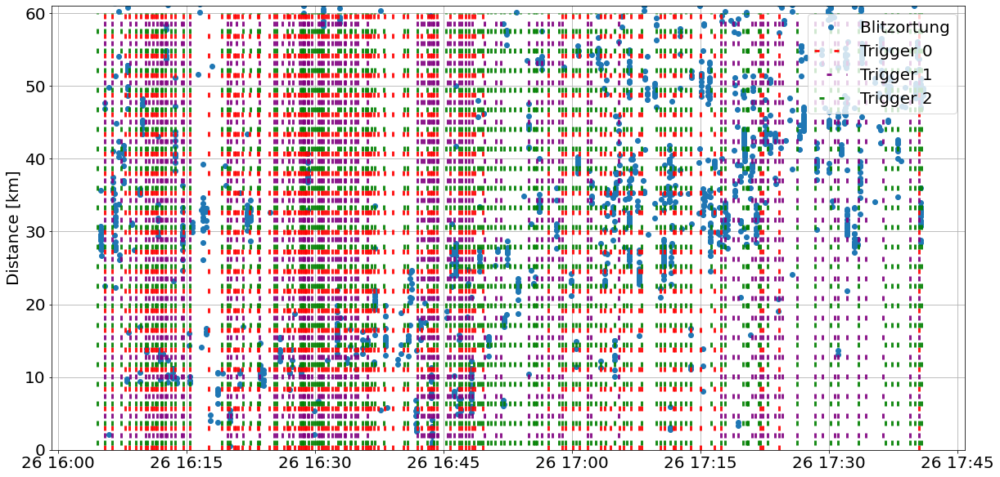

In [18]:
fig, (ax6) = plt.subplots(nrows=1, sharex=True, figsize=(20,10))
plt.rcParams.update({'font.size': 20})

ax6.plot(blitz.time, blitz.km, ls='', marker='o', label='Blitzortung')
ax6.set_ylabel('Distance [km]')
ax6.set_ylim(0,61)
ax6.grid()
ax6.vlines(x=trigger0['time'], ymin=0, ymax=60, color='red', label='Trigger 0', lw=3, linestyle=(0,(2,6)), alpha=0.9)
ax6.vlines(x=trigger1['time'], ymin=0, ymax=60, color='purple', label='Trigger 1', lw=3, linestyle=(3,(2,6)), alpha=0.9)
ax6.vlines(x=trigger2['time'], ymin=0, ymax=60, color='green', label='Trigger 2', lw=3, linestyle=(6,(2,6)), alpha=0.9)
ax6.legend(loc=1)
plt.rcParams.update({'font.size': 20})

#ax6.set_xlim(pd.Timestamp('2022-08-26 17:26:00'),pd.Timestamp('2022-08-26 17:28:00'))

import matplotlib.dates as mdates
#ax6.xaxis.set_minor_locator(mdates.SecondLocator())
#ax6.tick_params(axis='x', which='minor')


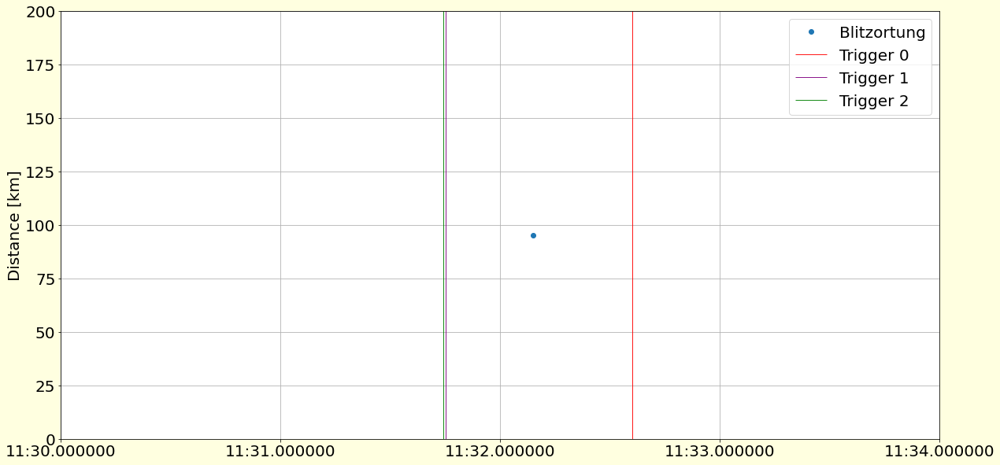

In [193]:
fig, (ax6) = plt.subplots(nrows=1, sharex=True, figsize=(20,10), facecolor='lightyellow')
plt.rcParams.update({'font.size': 20})

ax6.plot(blitz.time + pd.to_timedelta(-0, unit='s'), blitz.km, ls='', marker='o', label='Blitzortung')
ax6.set_ylabel('Distance [km]')
ax6.set_ylim(0,200)
ax6.grid()
ax6.vlines(x=trigger0['time'], ymin=0, ymax=200, color='red', label='Trigger 0', lw=1, linestyle='-', alpha=0.9)
ax6.vlines(x=trigger1['time'], ymin=0, ymax=200, color='purple', label='Trigger 1', lw=1, linestyle='-', alpha=0.9)
ax6.vlines(x=trigger2['time'], ymin=0, ymax=200, color='green', label='Trigger 2', lw=1, linestyle='-', alpha=0.9)
ax6.legend(loc=1)
plt.rcParams.update({'font.size': 20})

ax6.set_xlim(pd.Timestamp('2022-08-26 16:06:00'),pd.Timestamp('2022-08-26 17:00:00')) # 
ax6.set_xlim(pd.Timestamp('2022-08-26 16:06:15'),pd.Timestamp('2022-08-26 16:06:25')) # 1. blesk 0, -18
#ax6.set_xlim(pd.Timestamp('2022-08-26 16:09:00'),pd.Timestamp('2022-08-26 16:09:10')) # 2. blesk mic
ax6.set_xlim(pd.Timestamp('2022-08-26 16:11:30'),pd.Timestamp('2022-08-26 16:11:34')) # 3. blesk 0 
#ax6.set_xlim(pd.Timestamp('2022-08-26 16:23:29'),pd.Timestamp('2022-08-26 16:23:32')) # 4. blesk -36
#ax6.set_xlim(pd.Timestamp('2022-08-26 17:12:38'),pd.Timestamp('2022-08-26 17:12:40')) # 5. blesk +36
#ax6.set_xlim(pd.Timestamp('2022-08-26 17:14:54'),pd.Timestamp('2022-08-26 17:14:58')) # 6. blesk -18, 
#ax6.set_xlim(pd.Timestamp('2022-08-26 17:26:14'),pd.Timestamp('2022-08-26 17:26:17')) # 7. blesk -18, +36
#ax6.set_xlim(pd.Timestamp('2022-08-26 17:40:00'),pd.Timestamp('2022-08-26 17:41:00')) # 8. blesk +36

import matplotlib.dates as mdates
#ax6.xaxis.set_minor_locator(mdates.SecondLocator())
#ax6.tick_params(axis='x', which='minor')


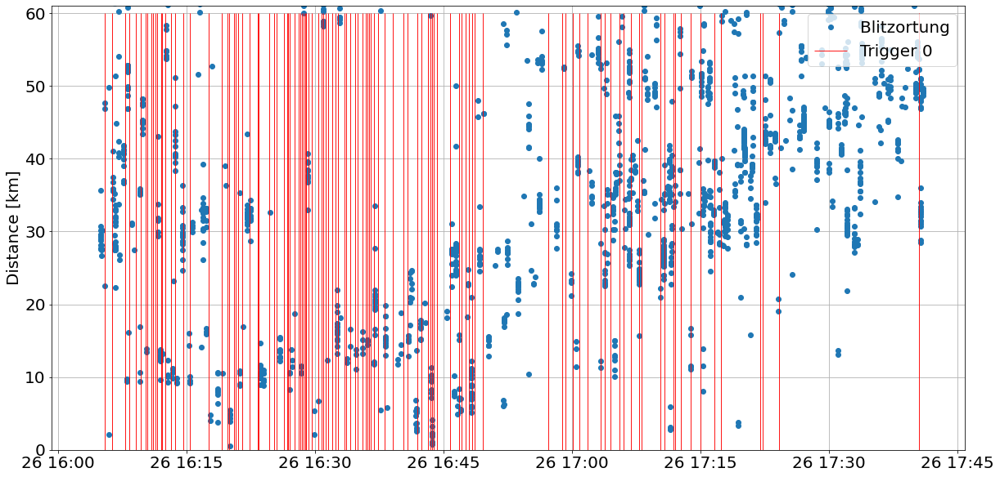

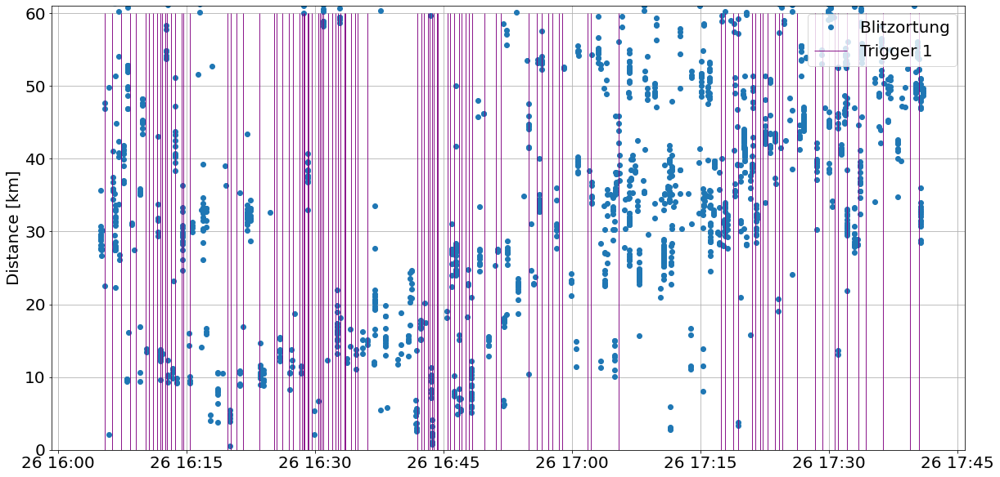

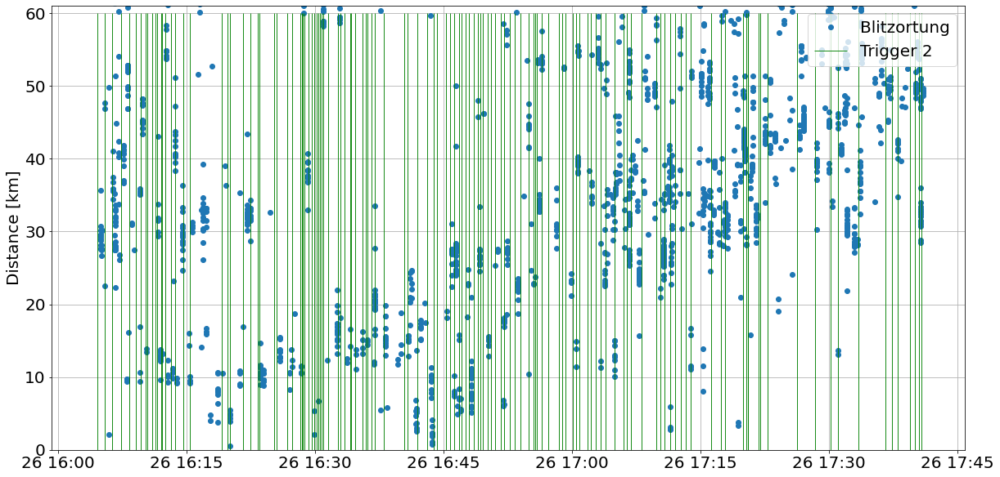

In [19]:
fig, (ax6) = plt.subplots(nrows=1, sharex=True, figsize=(20,10))
plt.rcParams.update({'font.size': 20})
ax6.plot(blitz.time, blitz.km, ls='', marker='o', label='Blitzortung')
ax6.set_ylabel('Distance [km]')
ax6.set_ylim(0,61)
ax6.grid()
ax6.vlines(x=trigger0['time'], ymin=0, ymax=60, color='red', label='Trigger 0', lw=1, linestyle='-', alpha=0.9)
ax6.legend(loc=1)

fig, (ax6) = plt.subplots(nrows=1, sharex=True, figsize=(20,10))
plt.rcParams.update({'font.size': 20})
ax6.plot(blitz.time, blitz.km, ls='', marker='o', label='Blitzortung')
ax6.set_ylabel('Distance [km]')
ax6.set_ylim(0,61)
ax6.grid()
ax6.vlines(x=trigger1['time'], ymin=0, ymax=60, color='purple', label='Trigger 1', lw=1, linestyle='-', alpha=0.9)
ax6.legend(loc=1)

fig, (ax6) = plt.subplots(nrows=1, sharex=True, figsize=(20,10))
plt.rcParams.update({'font.size': 20})
ax6.plot(blitz.time, blitz.km, ls='', marker='o', label='Blitzortung')
ax6.set_ylabel('Distance [km]')
ax6.set_ylim(0,61)
ax6.grid()
ax6.vlines(x=trigger2['time'], ymin=0, ymax=60, color='green', label='Trigger 2', lw=1, linestyle='-', alpha=0.9)
ax6.legend(loc=1)


Text(0.5, 0, 'UTC')

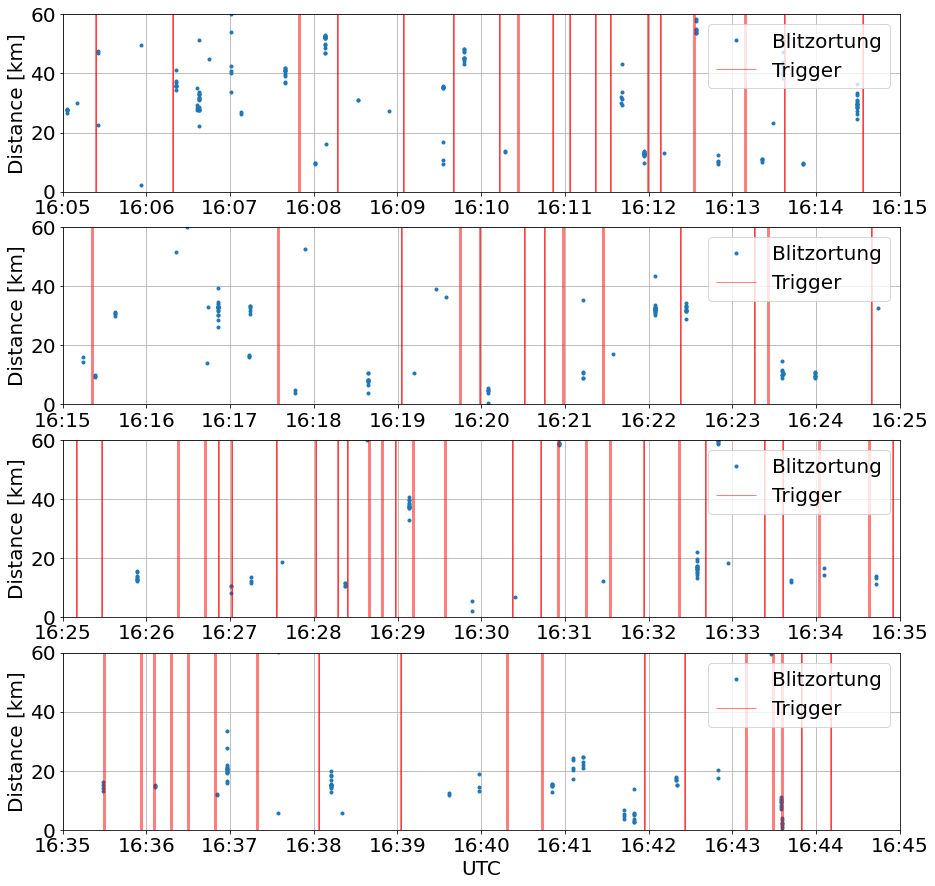

In [19]:
fig, (ax) = plt.subplots(nrows=4, figsize=(15,15))
plt.rcParams.update({'font.size': 20})

for n in range(0,4):
    ax[n].plot(blitz.time, blitz.km, ls='', marker='.', label='Blitzortung')
    ax[n].set_ylabel('Distance [km]')
    ax[n].set_ylim(0,60)
    ax[n].grid()
    ax[n].vlines(x=trigger0['time'], ymin=0, ymax=60, color='red', label='Trigger', lw=0.5, linestyle='-', alpha=1.0)
    ax[n].vlines(x=trigger0['time'] - pd.to_timedelta(0.5, unit='s'), ymin=0, ymax=60, color='red', lw=0.5, linestyle='-', alpha=1.0)
    ax[n].vlines(x=trigger0['time'] + pd.to_timedelta(0.5, unit='s'), ymin=0, ymax=60, color='red', lw=0.5, linestyle='-', alpha=1.0)

    xfmt = lambda x, pos: mdates.DateFormatter('%H:%M')(x)[:]
    ax[n].xaxis.set_major_formatter(plt.FuncFormatter(xfmt))

    ax[n].legend(loc=1)
    #ax[n].set_xlim(pd.Timestamp('2022-08-26 16:06:00'),pd.Timestamp('2022-08-26 16:50:00')) # 
    #ax[n].set_xlim(pd.Timestamp('2022-08-26 16:15:00'),pd.Timestamp('2022-08-26 16:25:00')) # 
    ax[n].set_xlim(pd.Timestamp('2022-08-26 16:05:00') + pd.to_timedelta(n*10, unit='min'),pd.Timestamp('2022-08-26 16:15:00') + pd.to_timedelta(n*10, unit='min')) # 

ax[3].set_xlabel('UTC')


Text(0.5, 0, 'UTC')

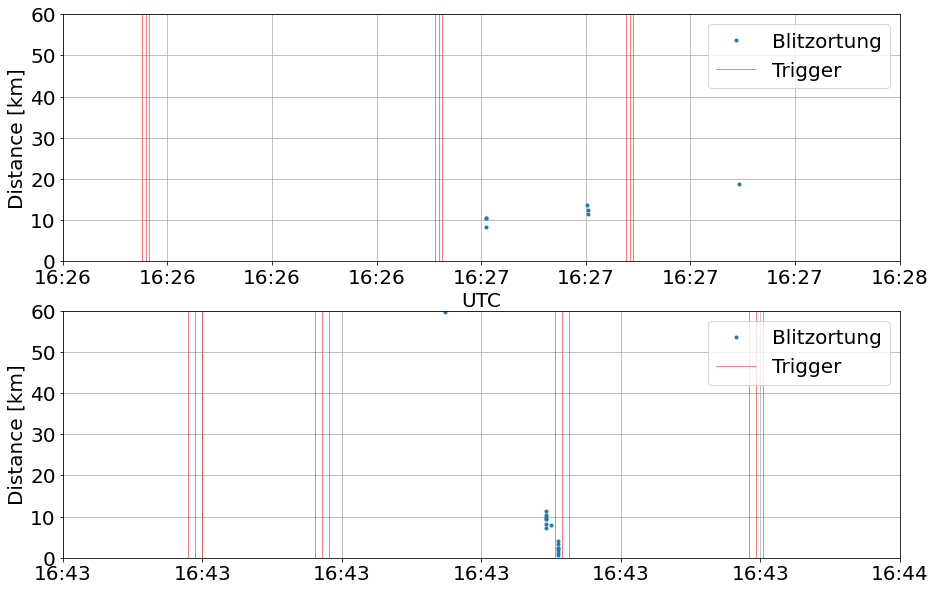

In [20]:
fig, (ax) = plt.subplots(nrows=2, figsize=(15,10))
plt.rcParams.update({'font.size': 20})

for n in range(0,2):
    ax[n].plot(blitz.time, blitz.km, ls='', marker='.', label='Blitzortung')
    ax[n].set_ylabel('Distance [km]')
    ax[n].set_ylim(0,60)
    ax[n].grid()
    ax[n].vlines(x=trigger1['time'], ymin=0, ymax=60, color='red', label='Trigger', lw=0.5, linestyle='-', alpha=1.0)
    ax[n].vlines(x=trigger1['time'] - pd.to_timedelta(0.5, unit='s'), ymin=0, ymax=60, color='red', lw=0.5, linestyle='-', alpha=1.0)
    ax[n].vlines(x=trigger1['time'] + pd.to_timedelta(0.5, unit='s'), ymin=0, ymax=60, color='red', lw=0.5, linestyle='-', alpha=1.0)

    xfmt = lambda x, pos: mdates.DateFormatter('%H:%M')(x)[:]
    ax[n].xaxis.set_major_formatter(plt.FuncFormatter(xfmt))

    ax[n].legend(loc=1)
    #ax[n].set_xlim(pd.Timestamp('2022-08-26 16:06:00'),pd.Timestamp('2022-08-26 16:50:00')) # 
    #ax[n].set_xlim(pd.Timestamp('2022-08-26 16:15:00'),pd.Timestamp('2022-08-26 16:25:00')) # 
    ax[0].set_xlim(pd.Timestamp('2022-08-26 16:26:00') ,pd.Timestamp('2022-08-26 16:28:00') ) # 
    ax[1].set_xlim(pd.Timestamp('2022-08-26 16:43:00') ,pd.Timestamp('2022-08-26 16:44:00') ) # 

ax[0].set_xlabel('UTC')


# ENTL

In [489]:
fn = '/storage/experiments/2022/0826_bourka_staryvestec_CAR0/ENTL/22082615_ensl.dat'

entl = pd.read_csv(fn, header=0, comment='*', low_memory=False, delim_whitespace=True)
entl['startT'] = pd.to_datetime(entl['startT'])
entl['endT'] = pd.to_datetime(entl['endT'])


/tmp/ipykernel_2128305/2118461231.py:3: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  entl = pd.read_csv(fn, header=0, comment='*', low_memory=False, delim_whitespace=True)


In [490]:
# Reduction of distant lightnings

entl['lonRad']=np.radians(entl.lon)
entl['latRad']=np.radians(entl.lat)
lonRad=np.radians(lon)
latRad=np.radians(lat)
entl['DlonRad']=lonRad-entl.lonRad
entl['DlatRad']=latRad-entl.latRad
entl['a']=np.sin(entl.DlatRad/2.)**2. + np.cos(entl.latRad) * np.cos(latRad) * np.sin(entl.DlonRad/2.)**2.
entl['km'] = 2. * np.arcsin(np.sqrt(entl.a))*6378.
entl = entl.loc[entl['km'] <= BLITZ_DIST]
entl.reset_index(inplace=True)

Text(0.5, 0, 'UTC')

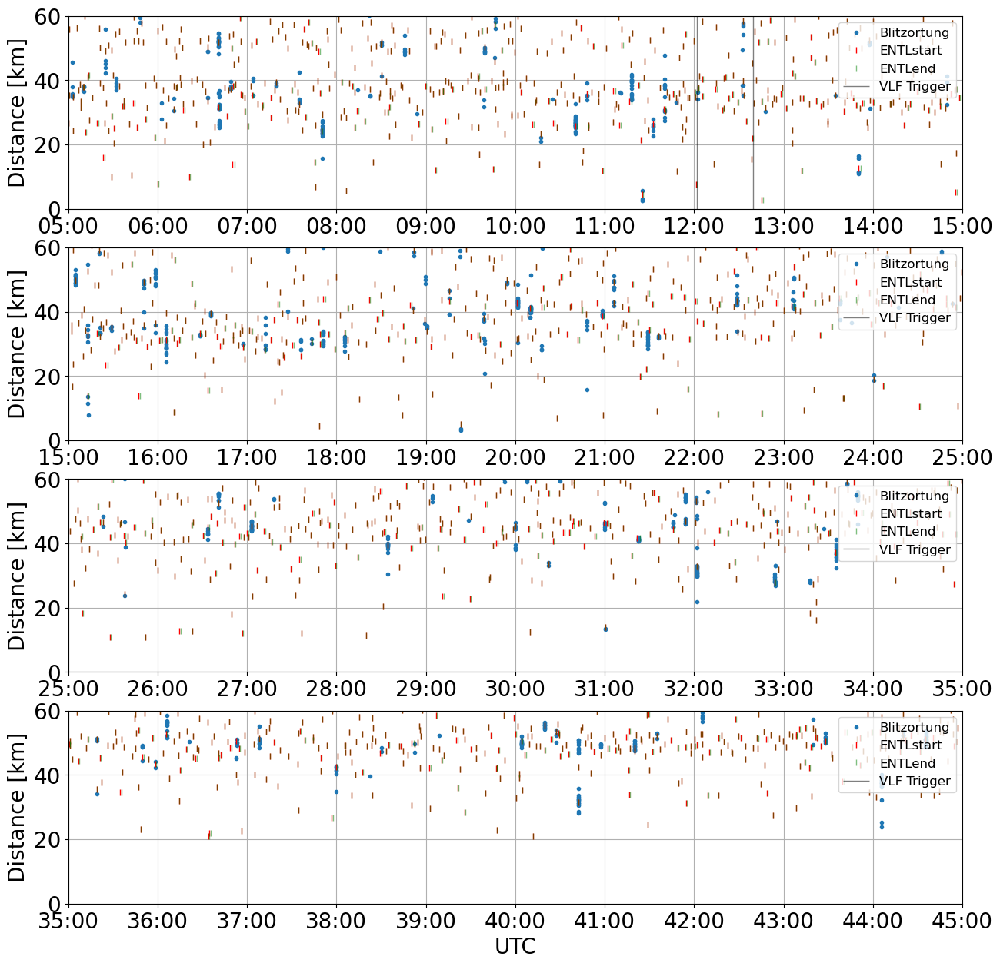

In [562]:
import matplotlib.dates as mdates

fig, (ax) = plt.subplots(nrows=4, figsize=(15,15))
plt.rcParams.update({'font.size': 20})

for n in range(0,4):
    ax[n].plot(blitz.time, blitz.km, ls='', marker='.', label='Blitzortung')
    ax[n].plot(entl.startT, entl.km, color='red', ls='', marker='|', label='ENTLstart')
    ax[n].plot(entl.endT, entl.km, color='green', ls='', marker='|', label='ENTLend', alpha=0.5)
    ax[n].set_ylabel('Distance [km]')
    ax[n].set_ylim(0,60)
    ax[n].grid()
    #ax[n].vlines(x=entl['startT'], color='red', ymin=0, ymax=60, label='ENTL start', lw=1.0, linestyle='dashed', alpha=1.0)
    #ax[n].vlines(x=entl['endT'], color='blue', ymin=0, ymax=60, label='ENTL end', lw=1.0, linestyle='dotted', alpha=1.0)
    
    ax[n].vlines(x=trigger0['time'], color='black', ymin=0, ymax=60, label='VLF Trigger', lw=1.0, linestyle='-', alpha=0.5)

    xfmt = lambda x, pos: mdates.DateFormatter('%M:%S')(x)[:]
    ax[n].xaxis.set_major_formatter(plt.FuncFormatter(xfmt))

    ax[n].legend(loc=1, fontsize=12)
    #ax[n].set_xlim(pd.Timestamp('2022-08-26 16:40:00') + pd.to_timedelta(n*4, unit='min'),pd.Timestamp('2022-08-26 16:44:00') + pd.to_timedelta(n*4, unit='min')) # 
    #ax[n].set_xlim(pd.Timestamp('2022-08-26 16:05:00') + pd.to_timedelta(n*10, unit='min'),pd.Timestamp('2022-08-26 16:15:00') + pd.to_timedelta(n*10, unit='min')) # 
    ax[n].set_xlim(pd.Timestamp('2022-08-26 17:05:00') + pd.to_timedelta(n*10, unit='min'),pd.Timestamp('2022-08-26 17:15:00') + pd.to_timedelta(n*10, unit='min')) # 

ax[3].set_xlabel('UTC')


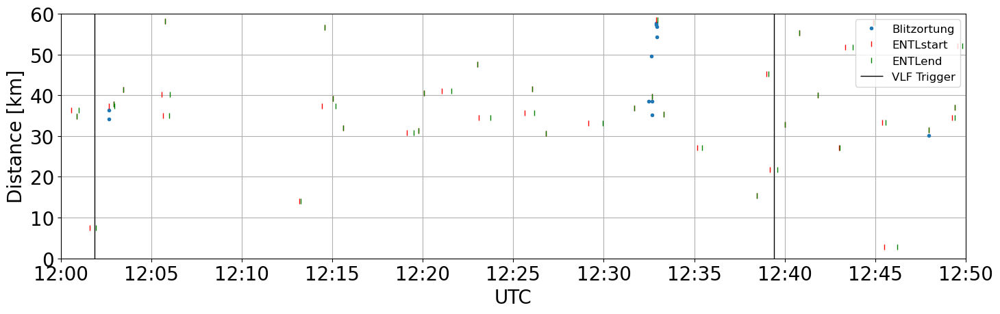

In [571]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# --- Časový rozsah ---
start = pd.Timestamp('2022-08-26 17:12:00')
end = pd.Timestamp('2022-08-26 17:12:50')

# --- Vykreslení ---
fig, ax = plt.subplots(figsize=(15, 5))
plt.rcParams.update({'font.size': 20})

# Data do jednoho grafu
ax.plot(blitz.time, blitz.km, ls='', marker='.', label='Blitzortung')
ax.plot(entl.startT, entl.km, color='red', ls='', marker='|', label='ENTLstart')
ax.plot(entl.endT, entl.km, color='green', ls='', marker='|', label='ENTLend', alpha=1.)
ax.vlines(x=trigger0['time'], color='black', ymin=0, ymax=60, label='VLF Trigger', lw=1.0, linestyle='-', alpha=1.)

# Osy
ax.set_ylabel('Distance [km]')
ax.set_xlabel('UTC')
ax.set_ylim(0, 60)
ax.set_xlim(start, end)
ax.grid()

# Formát času na ose X
xfmt = lambda x, pos: mdates.DateFormatter('%M:%S')(x)[:]
ax.xaxis.set_major_formatter(plt.FuncFormatter(xfmt))

# Legenda
ax.legend(loc='upper right', fontsize=12)

plt.tight_layout()
plt.show()


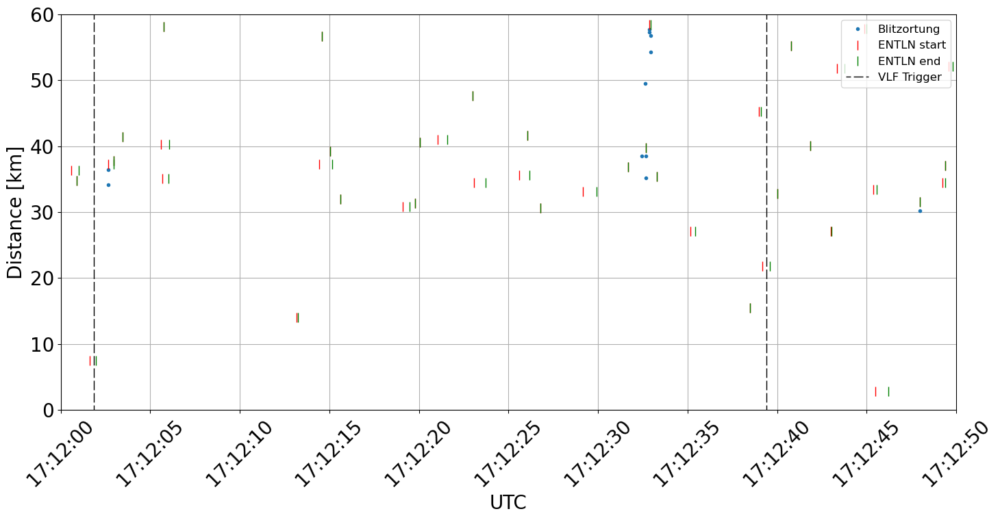

In [586]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# --- Časový rozsah ---
start = pd.Timestamp('2022-08-26 17:12:00')
end = pd.Timestamp('2022-08-26 17:12:50')

# --- Vykreslení ---
fig, ax = plt.subplots(figsize=(15, 8))
plt.rcParams.update({'font.size': 20})

# Data
ax.plot(blitz.time, blitz.km, ls='', marker='.', label='Blitzortung')
ax.plot(entl.startT, entl.km, color='red', ls='', marker='|', ms=10, label='ENTLN start')
ax.plot(entl.endT, entl.km, color='green', ls='', marker='|', ms=10, label='ENTLN end', alpha=1.)
ax.vlines(x=trigger0['time'], color='black', ymin=0, ymax=60, label='VLF Trigger', lw=1.0, linestyle=(5,(10,3)), alpha=1.)

# Osy
ax.set_ylabel('Distance [km]')
ax.set_xlabel('UTC')
ax.set_ylim(0, 60)
ax.set_xlim(start, end)
ax.grid()

# Formát času s milisekundami a rotace
ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
plt.xticks(rotation=45)

# Legenda
ax.legend(loc='upper right', fontsize=12)

plt.tight_layout()
plt.show()


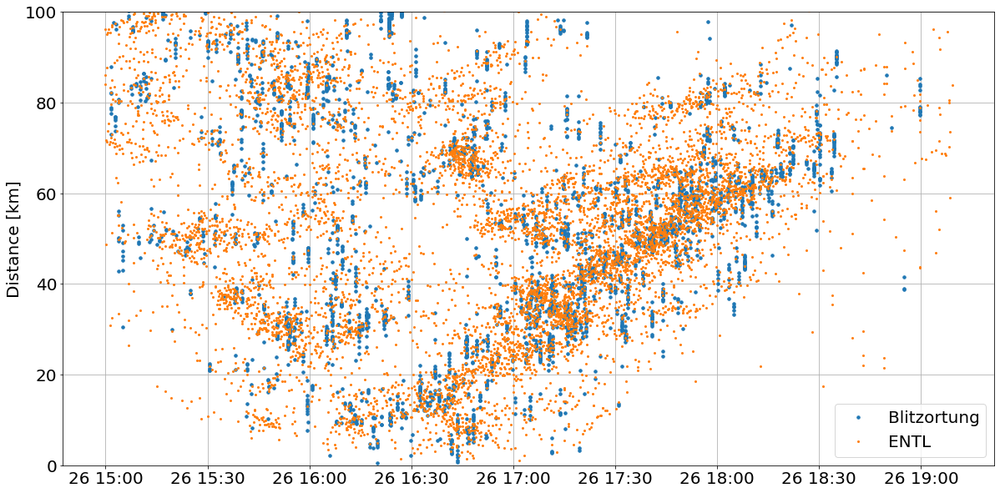

In [91]:
fig, (ax6) = plt.subplots(nrows=1, sharex=True, figsize=(20,10))
plt.rcParams.update({'font.size': 20})

ax6.plot(blitz.time, blitz.km, ls='', marker='.', ms=7, label='Blitzortung', alpha=1)
ax6.plot(entl.startT, entl.km, ls='', marker='.', ms=4, label='ENTL', alpha=1)
#ax6.plot(entl.endT, entl.km, ls='', marker='.', label='ENTL', alpha=0.6)
ax6.set_ylabel('Distance [km]')
ax6.set_ylim(0,100)
ax6.grid()
#ax6.vlines(x=gps['timeR'], ymin=0, ymax=130, color='red', label='Trigger STP', lw=1, linestyle='-', alpha=0.3)
ax6.legend()
plt.rcParams.update({'font.size': 20})
